# Diagnóstico de la enfermedad Diabetes en la población de Indios Pimas

---
La población para este estudio fue un grupo de mujeres pertenecientes al etnia Pima de una localidad cercana a Arizona EEUU. Cada residente de la comunidad fue entrevistado cada dos años incluyendo pruebas de tolerancia a la glucosa. La enfermedad de Diabetes fue diagnosticada según los estándares de la Organización Mundial de la Saludo. 

Fuentes del estudio: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2245318/


El siguiente dataset cuenta con un número de variables a considerar al momento de diagnosticar si un paciente tiene o no la enfermedad de Diabetes. 


Estructura del trabajo:
*   [Análisis exploratorio de los datos (EDA)](#s1)
    * [Descripción básica de los datos](#s11)
    * [Descripción de variables](#s12)
    * [Exploración utilizando profiling](#s13)
    * [Distribución de variables numéricas](#s14)
    * [Balanceo de clases](#s15)
*   [Ingeniería de Features (Feature Engineering)](#s2)
    * [Tipo de datos](#s21)
    * [Datos faltantes](#s22)
    * [Valores duplicados](#s23)
    * [Outliers](#s24)
    * [Correlación entre variables](#s25)
*   [Análisis componentes principales PCA](#s3)
*   [Técnicas de resampling balance de clases](#s4)
*   [Validación de Modelos](#s5)
*   [Comparación de Modelos](#s6)

## Exploración de Datos

In [0]:
# #Instalación pandas profiling
!pip install -U pandas-profiling -q

In [0]:
!jupyter nbextension enable --py widgetsnbextension

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


In [0]:
!pip install xgboost -q

In [0]:
!pip install --upgrade pip -q

In [0]:
!pip install imblearn -q

In [0]:
#Cargamos librerías útiles:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib as mpl
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import scipy.stats as stats
%matplotlib inline

#Modelos lineales
from sklearn.linear_model import LinearRegression, LogisticRegression, SGDClassifier, Ridge, LogisticRegressionCV

#Modelos de Arboles
from sklearn.tree import DecisionTreeClassifier

#Modelos ensambles
from sklearn.ensemble import IsolationForest, RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, ExtraTreesClassifier
from xgboost.sklearn import XGBClassifier
from sklearn.ensemble import StackingClassifier

#Otros Modelos:
from sklearn.decomposition import PCA
from sklearn.svm import LinearSVC, NuSVC, SVC
from sklearn.neighbors import KNeighborsClassifier

#Imputadores
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer, SimpleImputer

#Pipeline
from sklearn.pipeline import Pipeline
from sklearn import set_config
from sklearn.pipeline import make_pipeline

#Validación de modelos
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, cross_val_predict, RandomizedSearchCV, HalvingGridSearchCV, GridSearchCV

#Transformaciones:
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import ColumnTransformer


#Sampling
from sklearn.model_selection import train_test_split # To split data
from imblearn.over_sampling import SMOTE, ADASYN, BorderlineSMOTE, KMeansSMOTE, SVMSMOTE 
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, NearMiss
from imblearn.over_sampling import RandomOverSampler
from imblearn.pipeline import Pipeline as PipelineSampling

#Metrics
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, plot_confusion_matrix, roc_curve, classification_report, log_loss

import random
seed = random.seed(10)

In [0]:
!pip install mlflow -q

In [0]:
import mlflow
import mlflow.sklearn

In [0]:
token = dbutils.notebook.entry_point.getDbutils().notebook().getContext().apiToken().get()
dbutils.fs.put("file:///root/.databrickscfg","[DEFAULT]\nhost=https://community.cloud.databricks.com\ntoken = "+token,overwrite=True)

Wrote 98 bytes.
Out[9]: True

In [0]:
#Leemos el dataset
df = spark.sql("select * from default.diabetes_2_csv")
df = df.toPandas()

### Descripción básica de los datos:

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Pregnancies               768 non-null    object
 1   Glucose                   768 non-null    object
 2   BloodPressure             768 non-null    object
 3   SkinThickness             768 non-null    object
 4   Insulin                   768 non-null    object
 5   BMI                       768 non-null    object
 6   DiabetesPedigreeFunction  768 non-null    object
 7   Age                       768 non-null    object
 8   Outcome                   768 non-null    object
dtypes: object(9)
memory usage: 54.1+ KB


In [0]:
df = df.astype('float')

In [0]:
#Primeras 5 filas
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.0,148.0,72.0,35.0,0.0,33.6,0.627,50.0,1.0
1,1.0,85.0,66.0,29.0,0.0,26.6,0.351,31.0,0.0
2,8.0,183.0,64.0,0.0,0.0,23.3,0.672,32.0,1.0
3,1.0,89.0,66.0,23.0,94.0,28.1,0.167,21.0,0.0
4,0.0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1.0


In [0]:
#Ultimas 5 filas
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10.0,101.0,76.0,48.0,180.0,32.9,0.171,63.0,0.0
764,2.0,122.0,70.0,27.0,0.0,36.8,0.340,27.0,0.0
765,5.0,121.0,72.0,23.0,112.0,26.2,0.245,30.0,0.0
766,1.0,126.0,60.0,0.0,0.0,30.1,0.349,47.0,1.0
767,1.0,93.0,70.0,31.0,0.0,30.4,0.315,23.0,0.0


In [0]:
#Descripción rapida de los datos:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [0]:
# Utilizaremos la librería profiling para realizar un ana
profiling = pandas_profiling.ProfileReport(df)
profiling.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<iframe width="100%" height="800px" srcdoc="<!doctype html><html lang=en><head><meta charset=utf-8><meta name=viewport content="width=device-width, initial-scale=1, shrink-to-fit=no"><meta name=description content="Profile report generated with the `pandas-profiling` Python package"><meta name=author content="Simon Brugman and the open source community."><meta name=generator content="Pandas Profiling v3.1.0"><meta name=url content=https://github.com/pandas-profiling/pandas-profiling><meta name=date content="2022-04-14 00:39:11.827274"><title>Pandas Profiling Report</title><style>
/*!
 * Bootstrap v3.3.7 (http://getbootstrap.com)
 * Copyright 2011-2016 Twitter, Inc.
 * Licensed under MIT (https://github.com/twbs/bootstrap/blob/master/LICENSE)
 *//*! normalize.css v3.0.3 | MIT License | github.com/necolas/normalize.css */html{font-family:sans-serif;-webkit-text-size-adjust:100%;-ms-text-size-adjust:100%}body{margin:0}article,aside,details,figcaption,figure,footer,header,hgroup,main,menu,nav,section,summary{display:block}audio,canvas,progress,video{display:inline-block;vertical-align:baseline}audio:not([controls]){display:none;height:0}[hidden],template{display:none}a{background-color:transparent}a:active,a:hover{outline:0}abbr[title]{border-bottom:1px dotted}b,strong{font-weight:700}dfn{font-style:italic}h1{margin:.67em 0;font-size:2em}mark{color:#000;background:#ff0}small{font-size:80%}sub,sup{position:relative;font-size:75%;line-height:0;vertical-align:baseline}sup{top:-.5em}sub{bottom:-.25em}img{border:0}svg:not(:root){overflow:hidden}figure{margin:1em 40px}hr{height:0;-webkit-box-sizing:content-box;-moz-box-sizing:content-box;box-sizing:content-box}pre{overflow:auto}code,kbd,pre,samp{font-family:monospace,monospace;font-size:1em}button,input,optgroup,select,textarea{margin:0;font:inherit;color:inherit}button{overflow:visible}button,select{text-transform:none}button,html input[type=button],input[type=reset],input[type=submit]{-webkit-appearance:button;cursor:pointer}button[disabled],html input[disabled]{cursor:default}button::-moz-focus-inner,input::-moz-focus-inner{padding:0;border:0}input{line-height:normal}input[type=checkbox],input[type=radio]{-webkit-box-sizing:border-box;-moz-box-sizing:border-box;box-sizing:border-box;padding:0}input[type=number]::-webkit-inner-spin-button,input[type=number]::-webkit-outer-spin-button{height:auto}input[type=search]{-webkit-box-sizing:content-box;-moz-box-sizing:content-box;box-sizing:content-box;-webkit-appearance:textfield}input[type=search]::-webkit-search-cancel-button,input[type=search]::-webkit-search-decoration{-webkit-appearance:none}fieldset{padding:.35em .625em .75em;margin:0 2px;border:1px solid silver}legend{padding:0;border:0}textarea{overflow:auto}optgroup{font-weight:700}table{border-spacing:0;border-collapse:collapse}td,th{padding:0}/*! Source: https://github.com/h5bp/html5-boilerplate/blob/master/src/css/main.css */@media print{*,:after,:before{color:#000!important;text-shadow:none!important;background:0 0!important;-webkit-box-shadow:none!important;box-shadow:none!important}a,a:visited{text-decoration:underline}a[href]:after{content:" (" attr(href) ")"}abbr[title]:after{content:" (" attr(title) ")"}a[href^="javascript:"]:after,a[href^="#"]:after{content:""}blockquote,pre{border:1px solid #999;page-break-inside:avoid}thead{display:table-header-group}img,tr{page-break-inside:avoid}img{max-width:100%!important}h2,h3,p{orphans:3;widows:3}h2,h3{page-break-after:avoid}.navbar{display:none}.btn>.caret,.dropup>.btn>.caret{border-top-color:#000!important}.label{border:1px solid #000}.table{border-collapse:collapse!important}.table td,.table th{background-color:#fff!important}.table-bordered td,.table-bordered th{border:1px solid #ddd!important}}@font-face{font-family:'Glyphicons Halflings';src:url(../fonts/glyphicons-halflings-regular.eot);src:url(../fonts/glyphicons-halflings-regular.eot?#iefix) format('embedded-opentype'),url(../fonts/glyphicons-halflings-regular.woff2) forma

### Descripción de variables:

El dataset esta constituido por ocho variables que identifican factores de riesgo de la enfermedad de diabetes en la población.

* Pregnancies: Número de embarazos.
* Glucose: Concentración de glucosa obtenido mediante el test de tolerancia oral (GTT).
* BloodPressure: Variable que mide la presión arterial diastolica.
* SkinThickness: Variable que mide el espesor del pliegue de la piel del tríceps.
* Insulin: Medición del valor de insulina sérica por cada 2 hora.
* BMI: Indice de masa corporal.
* DiabetesPedigreeFunction: Función creada para determinar la probabilidad de padecer la enfermedad de diabetes basado en la historia familiar.
* Age: Edad
* Outcome: Variable target, 1 si la persona ha sido diagnosticada con la enfermedad y 0 si no.

### Descripción utilizando la librería profiling:

**Correlación:**

* La variable Pregnancies esta altamente correlacionada con la variable Age
* La variable SkinThickness esta altamente correlacionada con la variable Insulin
* La variable Insulin esta altamente correlacionada con la variable SkinThickness
* La variable Age esta altamente correlacionada con la variable Pregnancies
* La variable Pregnancies esta altamente correlacionada con la variable Age
* La variable BloodPressure esta altamente correlacionada con la variable  BMI

**Faltantes:**
Si bien el dataset no tienes valores faltantes se encontró que varias variables tienen valores en cero.

* BloodPressure tiene 35 valores en cero (4.6%) 
* SkinThickness tiene 227 (29.6%) zeros	Zeros
* Insulin tiene 374 valores en cero (48.7%)
* BMI tiene 11 valores en cero (1.4%)

**Dataset:**
* 768 registros.
* 8 variables de entrada numéricas.
* La variable outcome es la variable de salida.

### Distribución de variables numericas

In [0]:
def display_dataset_distributions (df, features):
    for col in features:
        df_aux = df[df[col].notnull()][col]
        plt.figure(figsize=(15,4))
        plt.subplot(131)
        sns.histplot(data=df_aux,kde=True, label="skew: " + str(np.round(df_aux.skew(),2)))
        plt.legend()
        plt.subplot(132)
        sns.boxplot(x=df[col])
        plt.subplot(133)
        stats.probplot(df_aux, plot=plt)
        plt.tight_layout()
        plt.show()

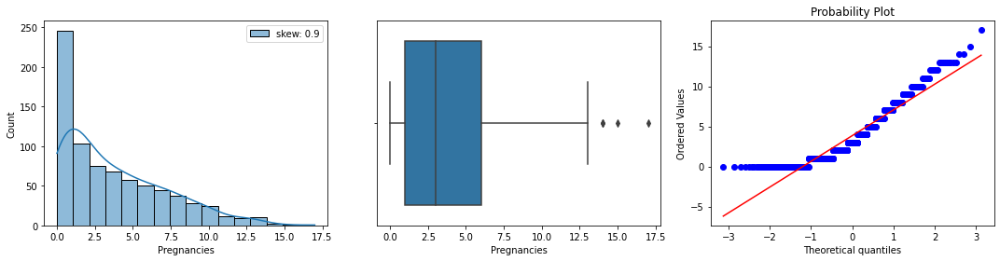

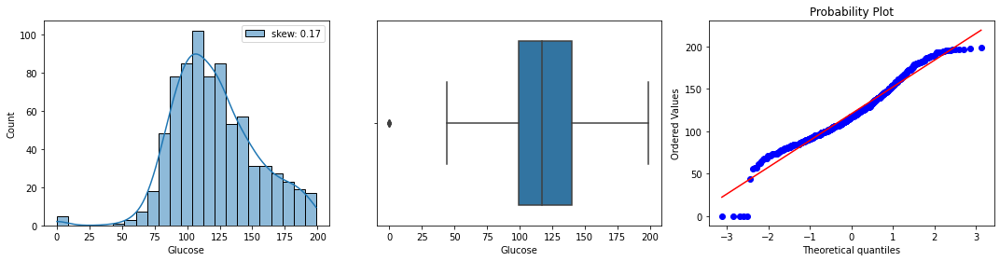

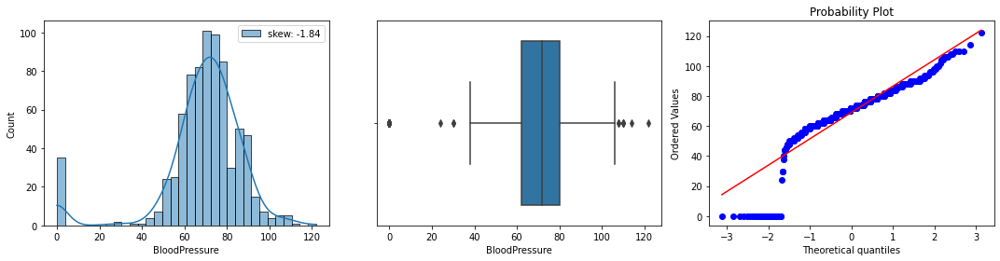

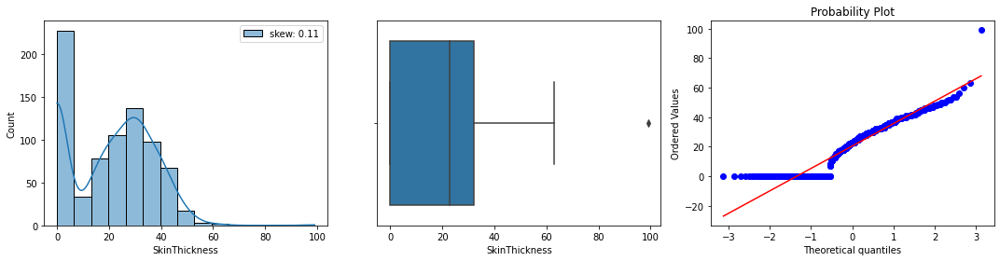

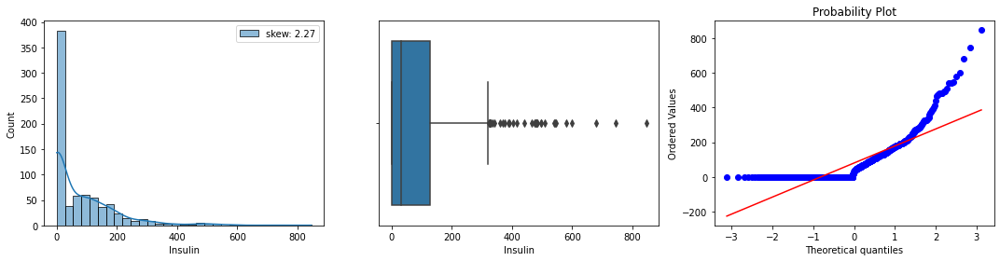

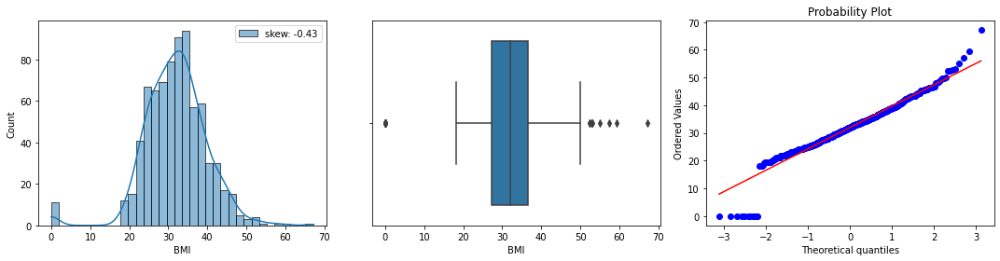

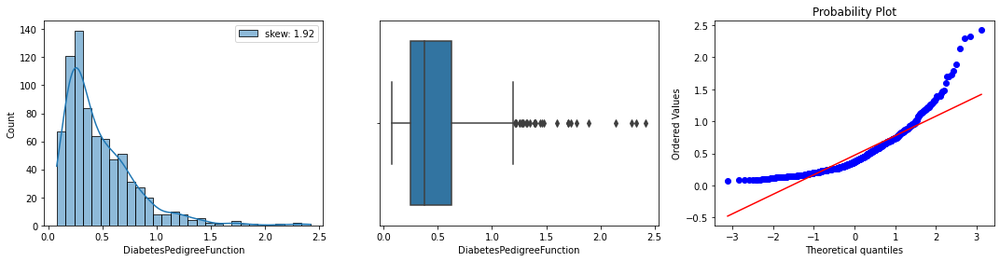

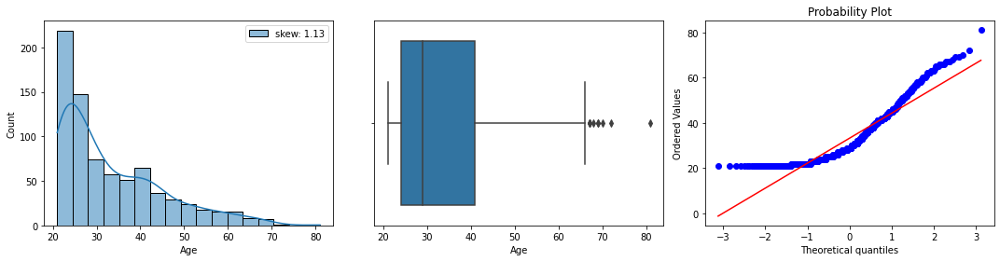

In [0]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', ]
display_dataset_distributions(df,features)

<a name="s15"></a>

### Balanceo de clases:

In [0]:
print("Número de muestras para el Outcome 0 : ",len(df[df['Outcome']==0]))
print("Número de muestras para el Outcome 1 : ",len(df[df['Outcome']==1]))

Número de muestras para el Outcome 0 :  500
Número de muestras para el Outcome 1 :  268


Se observa que las clases están levemente desbalanceadas.

## Feature Engineering

### Tipo de datos:

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    float64
 1   Glucose                   768 non-null    float64
 2   BloodPressure             768 non-null    float64
 3   SkinThickness             768 non-null    float64
 4   Insulin                   768 non-null    float64
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    float64
 8   Outcome                   768 non-null    float64
dtypes: float64(9)
memory usage: 54.1 KB


### Datos faltantes:

In [0]:
df.isnull().sum(axis=0)

Out[35]: Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

**Como habíamos observado anteriormente no existe valores faltantes pero si existen valores en cero en las siguientes variables:**
* BloodPressure tiene 35 valores en cero (4.6%) 
* SkinThickness tiene 227 (29.6%) zeros	Zeros
* Insulin tiene 374 valores en cero (48.7%)
* BMI tiene 11 valores en cero (1.4%)

In [0]:
# Reemplazamos NaN aquellos valores iguales a cero:
df.loc[df.BloodPressure == 0, "BloodPressure"] = np.nan
df.loc[df.SkinThickness == 0, "SkinThickness"] = np.nan
df.loc[df.Insulin == 0, "Insulin"] = np.nan
df.loc[df.BMI == 0, "Insulin"] = np.nan
df.loc[df.Glucose == 0, "Glucose"] = np.nan

## Imputación estadística:

In [0]:
X = df.drop(columns=['Outcome'])
y = df.Outcome

In [0]:
mlflow.set_experiment("/ml2")

Out[13]: <Experiment: artifact_location='dbfs:/databricks/mlflow-tracking/813965220679556', experiment_id='813965220679556', lifecycle_stage='active', name='/ml2', tags={'mlflow.experiment.sourceName': '/ml2',
 'mlflow.experimentType': 'MLFLOW_EXPERIMENT',
 'mlflow.ownerEmail': 'pedromperezc@gmail.com',
 'mlflow.ownerId': '7216084937830188'}>

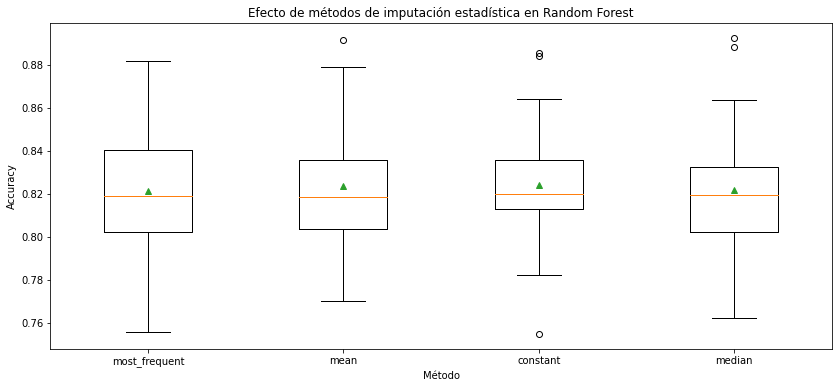

In [0]:
param_grid = {"imputer__strategy": ['most_frequent', 'mean','constant','median' ]}

with mlflow.start_run(run_name= "imputación estadística en Random Forest" , experiment_id=813965220679556):
    results=[]
    for param in param_grid["imputer__strategy"]:
        clf = Pipeline(steps=[  ( 'imputer' ,SimpleImputer()), 
                              ('logistic', RandomForestClassifier())
                         ])

        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=1)
        scores = cross_val_score(clf, X, y, scoring= 'roc_auc' , cv=cv)    
        results.append(scores)
        mlflow.log_metric(param, scores.mean())


    fig,axes = plt.subplots(1,figsize=(14,6))
    axes.boxplot(results,labels=param_grid["imputer__strategy"],showmeans=True)
    axes.set_xlabel("Método")
    axes.set_ylabel("Accuracy")
    axes.set_title("Efecto de métodos de imputación estadística en Random Forest");
    plt.show()

**Observaciones:**
No se logra ver una diferencia significativa entre los método de imputación por lo cual utilizar aplicaremos la que mejor valor arrojo IterativeImputer

### Valores duplicados:

In [0]:
sum(df.duplicated())

Out[69]: 0

### Outliers:

In [0]:
def total_outliers (df, features):
    df_outliers = pd.DataFrame({'feature': [], 'outliers_livianos': [], 'outliers_zscore':[]})
    iqr_outlier = []
    for col in features:
        
        #outliers z-score
        data_mean, data_std = np.mean(df[col]), np.std(df[col])
        cutoff = data_std*3
        lower,upper = data_mean-cutoff, data_mean+cutoff
        outliers_zscore = sum((df[col]<lower) | (df[col]>upper))

        
        #outliers iqr
        IQR = df[col].quantile(0.75) - df[col].quantile(0.25)
        limite_inferior = df[col].quantile(0.25) - (IQR * 1.5)
        limite_superior = df[col].quantile(0.75) + (IQR * 1.5)
        outliers_ligeros = sum((df[col] > limite_superior) | (df[col] < limite_inferior))

    
        df_outliers = df_outliers.append({'feature': col, 'outliers_livianos': outliers_ligeros, 
                                         'outliers_zscore': outliers_zscore,
                                         }, ignore_index=True)

    return df_outliers

In [0]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', ]
outliers = total_outliers(X, features)
outliers

,feature,outliers_livianos,outliers_zscore
0,Pregnancies,4.0,4.0
1,Glucose,0.0,0.0
2,BloodPressure,14.0,8.0
3,SkinThickness,3.0,2.0
4,Insulin,24.0,8.0
5,BMI,19.0,14.0
6,DiabetesPedigreeFunction,29.0,11.0
7,Age,9.0,5.0


**Método Z-score:** Con el Z-Score podemos ver que tan alejado de la media se encuentra una observación. Es una convención que si una observación se encuentra alejada de la media 3 veces la desviación estándar, se puede considerar outlier. 

**Método IQR:** Se utiliza el rango intercuartil para detectar los outliers. El rango intercuartil (IQR) va desde el percentil 25 (Q1) hasta el percentil 75 (Q3). Cualquier valor que sea menor a Q1-1.5*IQR o mayor a Q3+1.5*IQR, es considerado un outlier.

**Método Isolation Forest:** Al igual que en Random Forest, un modelo Isolation Forest está formado por la combinación de múltiples árboles llamados isolation trees. El método utiliza modelos con árboles donde se selecciona aleatoriamente una feature y un valor para la misma dentro de un determinado rango. Se va modificando el rango a medida que se procesan las observaciones y si se encuentra una observación donde ninguna otra muestra tiene valores dentro del rango de la misma, se considera aislada (outlier). El procedimiento es iterativo y se debe indicar la cantidad de veces a ejecutar esos pasos.

**Observaciones:**
* El análisis realizado utilizando la regla IQR tiende a penalizar un más a las variables que no tienen una distribución normal (Insulin, DiabetesPedigreeFunction, Age).

In [0]:
def iqr_outliers (df, features):
    iqr_outlier = []
    for col in features:
        
        #outliers iqr
        IQR = df[col].quantile(0.75) - df[col].quantile(0.25)
        limite_inferior = df[col].quantile(0.25) - (IQR * 1.5)
        limite_superior = df[col].quantile(0.75) + (IQR * 1.5)

        outliers_ligeros = sum((df[col] > limite_superior) | (df[col] < limite_inferior))
        iqr_outlier.append((df[col] > limite_superior) | (df[col] < limite_inferior))
    
    
    return iqr_outlier

In [0]:
def z_outliers (df, features):
    df_outliers = pd.DataFrame({'feature': [], 'outliers_livianos': [], 'outliers_pesados': [], 'outliers_zscore':[], 'outliers_forest':[]})
    z_outlier = []
    for col in features:
        
        #outliers z-score
        data_mean, data_std = np.mean(df[col]), np.std(df[col])
        cutoff = data_std*3
        lower,upper = data_mean-cutoff, data_mean+cutoff
        z_outlier.append((df[col]<lower) | (df[col]>upper))
    

    return z_outlier

In [0]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', ]
outliers_iqr = iqr_outliers(df, features)
outliers_z = z_outliers(df, features)

**Outliers variable Pregnancies:**

In [0]:
# Método iqr:
df[outliers_iqr[0]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
88,15.0,136.0,70.0,32.0,110.0,37.1,0.153,43.0,1.0
159,17.0,163.0,72.0,41.0,114.0,40.9,0.817,47.0,1.0
298,14.0,100.0,78.0,25.0,184.0,36.6,0.412,46.0,1.0
455,14.0,175.0,62.0,30.0,NaN,33.6,0.212,38.0,1.0


In [0]:
# Método z score:
df[outliers_z[0]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
88,15.0,136.0,70.0,32.0,110.0,37.1,0.153,43.0,1.0
159,17.0,163.0,72.0,41.0,114.0,40.9,0.817,47.0,1.0
298,14.0,100.0,78.0,25.0,184.0,36.6,0.412,46.0,1.0
455,14.0,175.0,62.0,30.0,NaN,33.6,0.212,38.0,1.0


**Outliers variable BloodPressure:**

In [0]:
# Método iqr:
df[outliers_iqr[2]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
18,1.0,103.0,30.0,38.0,83.0,43.3,0.183,33.0,0.0
43,9.0,171.0,110.0,24.0,240.0,45.4,0.721,54.0,1.0
84,5.0,137.0,108.0,NaN,NaN,48.8,0.227,37.0,1.0
106,1.0,96.0,122.0,NaN,NaN,22.4,0.207,27.0,0.0
125,1.0,88.0,30.0,42.0,99.0,55.0,0.496,26.0,1.0
177,0.0,129.0,110.0,46.0,130.0,67.1,0.319,26.0,1.0
362,5.0,103.0,108.0,37.0,NaN,39.2,0.305,65.0,0.0
549,4.0,189.0,110.0,31.0,NaN,28.5,0.680,37.0,0.0
597,1.0,89.0,24.0,19.0,25.0,27.8,0.559,21.0,0.0
599,1.0,109.0,38.0,18.0,120.0,23.1,0.407,26.0,0.0


In [0]:
# Método z score:
df[outliers_z[2]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
18,1.0,103.0,30.0,38.0,83.0,43.3,0.183,33.0,0.0
43,9.0,171.0,110.0,24.0,240.0,45.4,0.721,54.0,1.0
106,1.0,96.0,122.0,NaN,NaN,22.4,0.207,27.0,0.0
125,1.0,88.0,30.0,42.0,99.0,55.0,0.496,26.0,1.0
177,0.0,129.0,110.0,46.0,130.0,67.1,0.319,26.0,1.0
549,4.0,189.0,110.0,31.0,NaN,28.5,0.680,37.0,0.0
597,1.0,89.0,24.0,19.0,25.0,27.8,0.559,21.0,0.0
691,13.0,158.0,114.0,NaN,NaN,42.3,0.257,44.0,1.0


**Outliers variable SkinThickness:**

In [0]:
# Método iqr:
df[outliers_iqr[3]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
57,0.0,100.0,88.0,60.0,110.0,46.8,0.962,31.0,0.0
445,0.0,180.0,78.0,63.0,14.0,59.4,2.420,25.0,1.0
579,2.0,197.0,70.0,99.0,NaN,34.7,0.575,62.0,1.0


In [0]:
# Método z score:
df[outliers_z[3]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
445,0.0,180.0,78.0,63.0,14.0,59.4,2.420,25.0,1.0
579,2.0,197.0,70.0,99.0,NaN,34.7,0.575,62.0,1.0


**Outliers variable Insulin:**

In [0]:
# Método iqr:
df[outliers_iqr[4]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
8,2.0,197.0,70.0,45.0,543.0,30.5,0.158,53.0,1.0
13,1.0,189.0,60.0,23.0,846.0,30.1,0.398,59.0,1.0
111,8.0,155.0,62.0,26.0,495.0,34.0,0.543,46.0,1.0
153,1.0,153.0,82.0,42.0,485.0,40.6,0.687,23.0,0.0
186,8.0,181.0,68.0,36.0,495.0,30.1,0.615,60.0,1.0
220,0.0,177.0,60.0,29.0,478.0,34.6,1.072,21.0,1.0
228,4.0,197.0,70.0,39.0,744.0,36.7,2.329,31.0,0.0
231,6.0,134.0,80.0,37.0,370.0,46.2,0.238,46.0,1.0
247,0.0,165.0,90.0,33.0,680.0,52.3,0.427,23.0,0.0
248,9.0,124.0,70.0,33.0,402.0,35.4,0.282,34.0,0.0


In [0]:
# Método z score:
df[outliers_z[4]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
8,2.0,197.0,70.0,45.0,543.0,30.5,0.158,53.0,1.0
13,1.0,189.0,60.0,23.0,846.0,30.1,0.398,59.0,1.0
228,4.0,197.0,70.0,39.0,744.0,36.7,2.329,31.0,0.0
247,0.0,165.0,90.0,33.0,680.0,52.3,0.427,23.0,0.0
286,5.0,155.0,84.0,44.0,545.0,38.7,0.619,34.0,0.0
409,1.0,172.0,68.0,49.0,579.0,42.4,0.702,28.0,1.0
584,8.0,124.0,76.0,24.0,600.0,28.7,0.687,52.0,1.0
655,2.0,155.0,52.0,27.0,540.0,38.7,0.240,25.0,1.0


**Outliers variable BMI:**

In [0]:
# Método iqr:
df[outliers_iqr[5]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
9,8.0,125.0,96.0,NaN,NaN,0.0,0.232,54.0,1.0
49,7.0,105.0,NaN,NaN,NaN,0.0,0.305,24.0,0.0
60,2.0,84.0,NaN,NaN,NaN,0.0,0.304,21.0,0.0
81,2.0,74.0,NaN,NaN,NaN,0.0,0.102,22.0,0.0
120,0.0,162.0,76.0,56.0,100.0,53.2,0.759,25.0,1.0
125,1.0,88.0,30.0,42.0,99.0,55.0,0.496,26.0,1.0
145,0.0,102.0,75.0,23.0,NaN,0.0,0.572,21.0,0.0
177,0.0,129.0,110.0,46.0,130.0,67.1,0.319,26.0,1.0
193,11.0,135.0,NaN,NaN,NaN,52.3,0.578,40.0,1.0
247,0.0,165.0,90.0,33.0,680.0,52.3,0.427,23.0,0.0


In [0]:
# Método z score:
df[outliers_z[5]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
9,8.0,125.0,96.0,NaN,NaN,0.0,0.232,54.0,1.0
49,7.0,105.0,NaN,NaN,NaN,0.0,0.305,24.0,0.0
60,2.0,84.0,NaN,NaN,NaN,0.0,0.304,21.0,0.0
81,2.0,74.0,NaN,NaN,NaN,0.0,0.102,22.0,0.0
145,0.0,102.0,75.0,23.0,NaN,0.0,0.572,21.0,0.0
177,0.0,129.0,110.0,46.0,130.0,67.1,0.319,26.0,1.0
371,0.0,118.0,64.0,23.0,NaN,0.0,1.731,21.0,0.0
426,0.0,94.0,NaN,NaN,NaN,0.0,0.256,25.0,0.0
445,0.0,180.0,78.0,63.0,14.0,59.4,2.420,25.0,1.0
494,3.0,80.0,NaN,NaN,NaN,0.0,0.174,22.0,0.0


**Outliers variable DiabetesPedigreeFunction:**

In [0]:
# Método iqr:
df[outliers_iqr[6]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
4,0.0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1.0
12,10.0,139.0,80.0,NaN,NaN,27.1,1.441,57.0,0.0
39,4.0,111.0,72.0,47.0,207.0,37.1,1.390,56.0,1.0
45,0.0,180.0,66.0,39.0,NaN,42.0,1.893,25.0,1.0
58,0.0,146.0,82.0,NaN,NaN,40.5,1.781,44.0,0.0
100,1.0,163.0,72.0,NaN,NaN,39.0,1.222,33.0,1.0
147,2.0,106.0,64.0,35.0,119.0,30.5,1.400,34.0,0.0
187,1.0,128.0,98.0,41.0,58.0,32.0,1.321,33.0,1.0
218,5.0,85.0,74.0,22.0,NaN,29.0,1.224,32.0,1.0
228,4.0,197.0,70.0,39.0,744.0,36.7,2.329,31.0,0.0


In [0]:
# Método z score:
df[outliers_z[6]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
4,0.0,137.0,40.0,35.0,168.0,43.1,2.288,33.0,1.0
45,0.0,180.0,66.0,39.0,NaN,42.0,1.893,25.0,1.0
58,0.0,146.0,82.0,NaN,NaN,40.5,1.781,44.0,0.0
228,4.0,197.0,70.0,39.0,744.0,36.7,2.329,31.0,0.0
330,8.0,118.0,72.0,19.0,NaN,23.1,1.476,46.0,0.0
370,3.0,173.0,82.0,48.0,465.0,38.4,2.137,25.0,1.0
371,0.0,118.0,64.0,23.0,NaN,0.0,1.731,21.0,0.0
395,2.0,127.0,58.0,24.0,275.0,27.7,1.600,25.0,0.0
445,0.0,180.0,78.0,63.0,14.0,59.4,2.420,25.0,1.0
593,2.0,82.0,52.0,22.0,115.0,28.5,1.699,25.0,0.0


**Outliers variable Age:**

In [0]:
# Método iqr:
df[outliers_iqr[7]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
123,5.0,132.0,80.0,NaN,NaN,26.8,0.186,69.0,0.0
363,4.0,146.0,78.0,NaN,NaN,38.5,0.520,67.0,1.0
453,2.0,119.0,NaN,NaN,NaN,19.6,0.832,72.0,0.0
459,9.0,134.0,74.0,33.0,60.0,25.9,0.460,81.0,0.0
489,8.0,194.0,80.0,NaN,NaN,26.1,0.551,67.0,0.0
537,0.0,57.0,60.0,NaN,NaN,21.7,0.735,67.0,0.0
666,4.0,145.0,82.0,18.0,NaN,32.5,0.235,70.0,1.0
674,8.0,91.0,82.0,NaN,NaN,35.6,0.587,68.0,0.0
684,5.0,136.0,82.0,NaN,NaN,0.0,0.640,69.0,0.0


In [0]:
# Método z score:
df[outliers_z[7]]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
123,5.0,132.0,80.0,NaN,NaN,26.8,0.186,69.0,0.0
453,2.0,119.0,NaN,NaN,NaN,19.6,0.832,72.0,0.0
459,9.0,134.0,74.0,33.0,60.0,25.9,0.460,81.0,0.0
666,4.0,145.0,82.0,18.0,NaN,32.5,0.235,70.0,1.0
684,5.0,136.0,82.0,NaN,NaN,0.0,0.640,69.0,0.0


## Tratamiento de outliers mediante transformaciones:

Vamos a aplicar una estandarización de los datos para evaluar el comportamiento del modelo, en general cuando existe presencia de outliers la transformación recomendada es robust scalers o transformers.

In [0]:
def display_dataset_distributions_transf (df, features):
    for col in features:
        df_aux = df[df[col].notnull()][col].to_numpy()
        df_aux = df_aux.reshape((len(df_aux),1))
        df_aux.reshape((1,-1))[0]

        fig, axs = plt.subplots(1, 3, constrained_layout=True, figsize=(15, 4))
        sns.histplot(data=df_aux,kde=True, ax=axs[0])

        axs[0].set_ylabel('Count')
        fig.suptitle(col, fontsize=12)

        sns.boxplot(x=df_aux, ax=axs[1])
        stats.probplot(df_aux.reshape((1,-1))[0], plot=axs[2])

        plt.show()

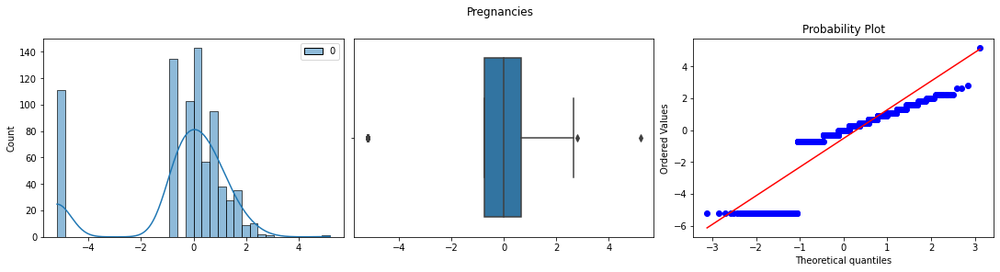

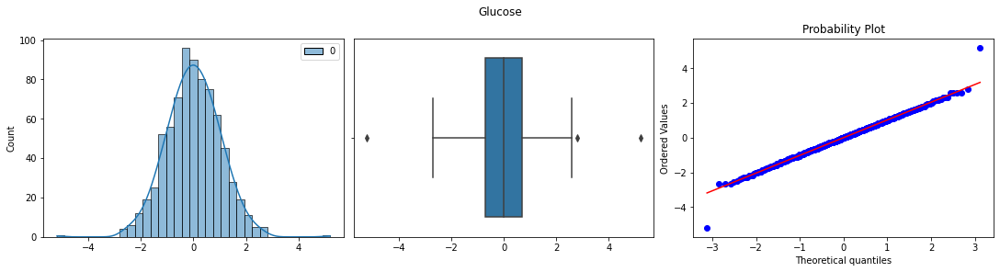

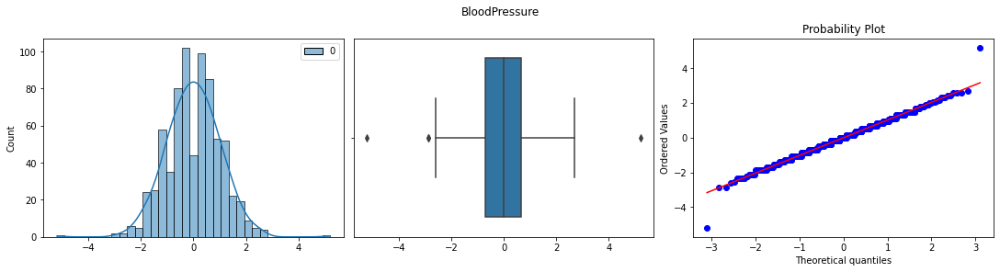

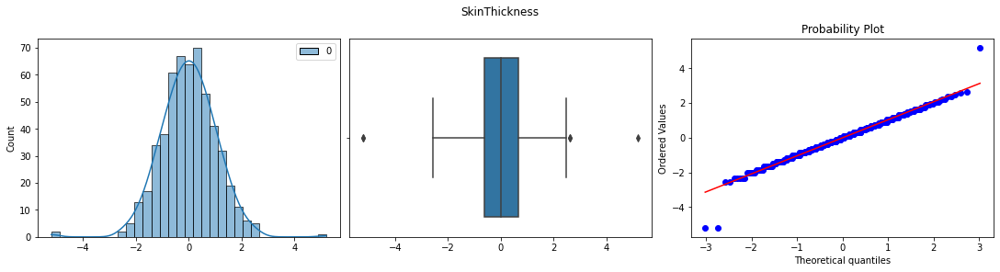

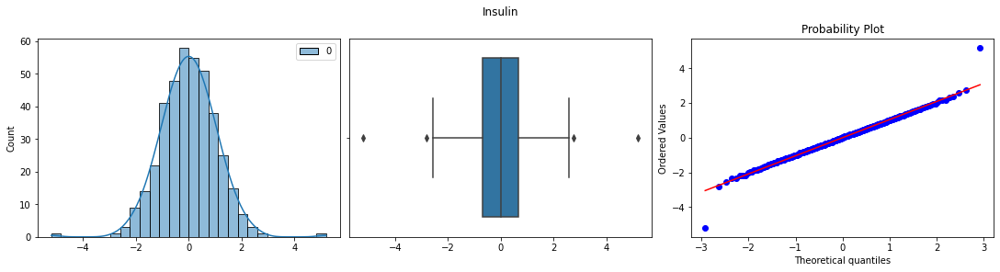

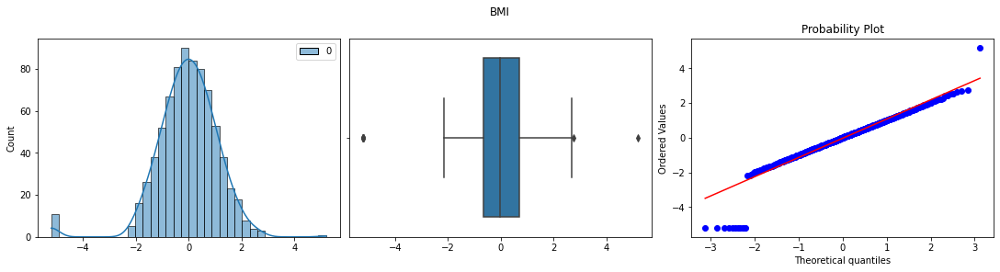

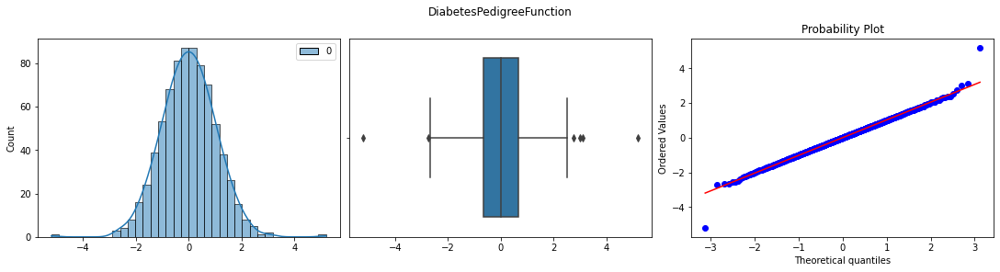

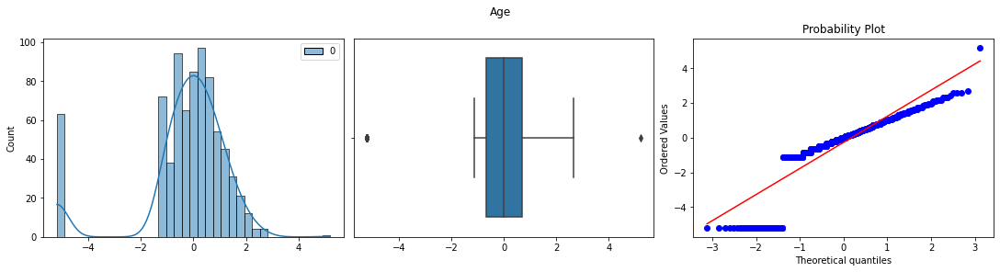

In [0]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', ]
qt = QuantileTransformer(n_quantiles=200, output_distribution='normal')
df_aux = pd.DataFrame(qt.fit(X).transform(X), columns=["Pregnancies","Glucose","BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age"])
display_dataset_distributions_transf (df_aux, features)
outliers_qt = total_outliers(df_aux, features)

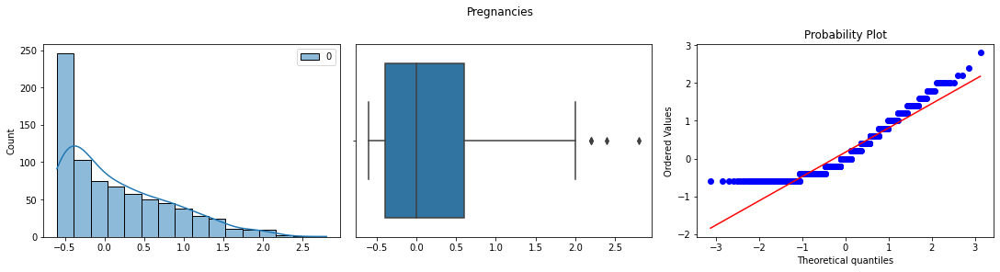

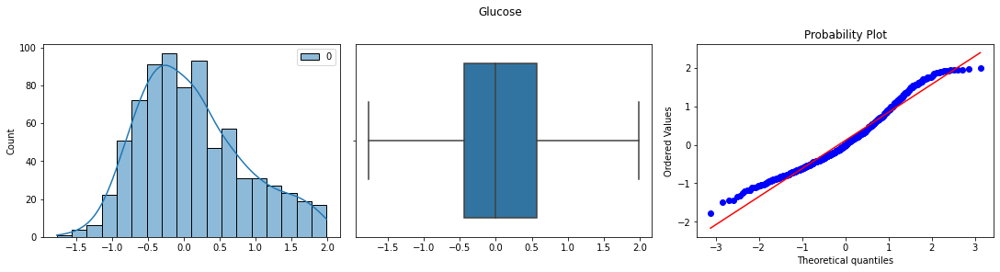

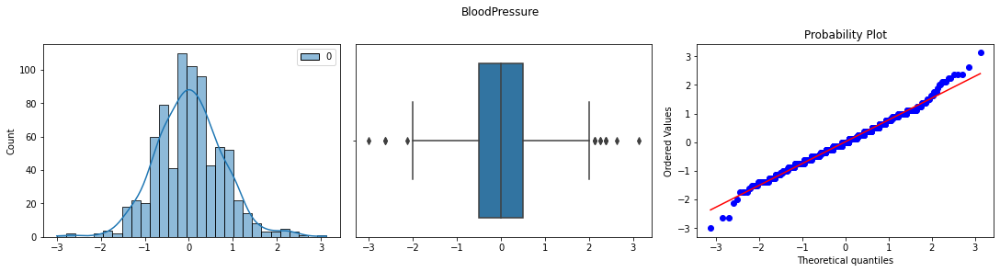

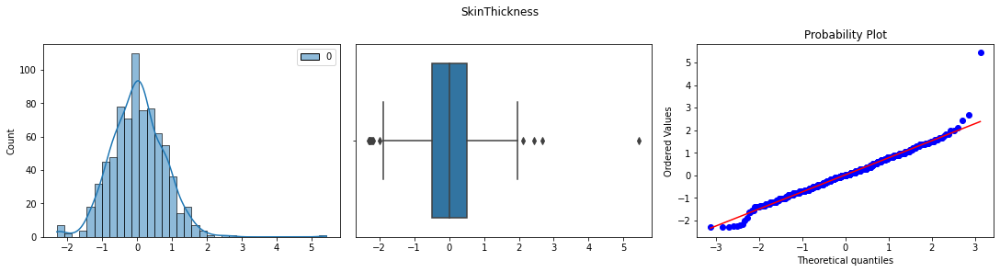

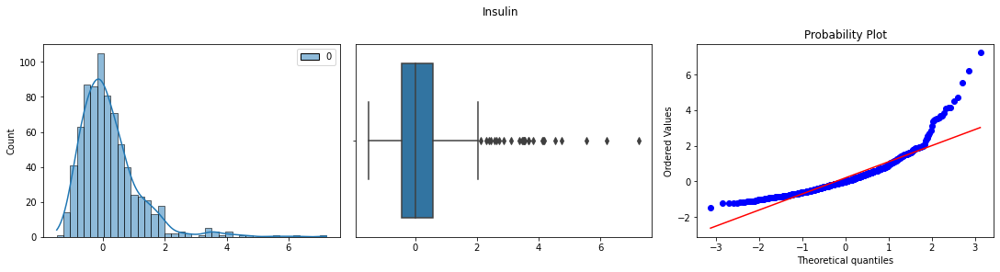

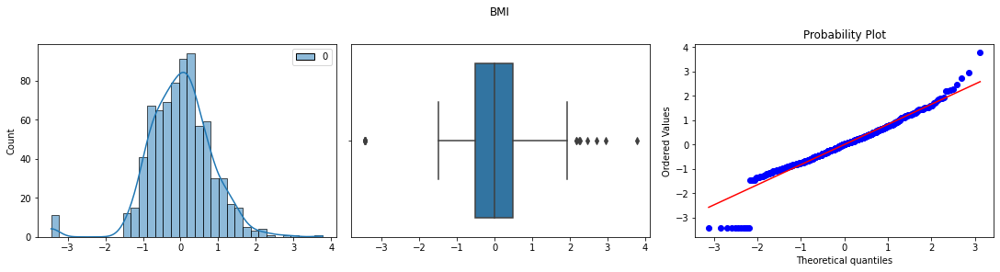

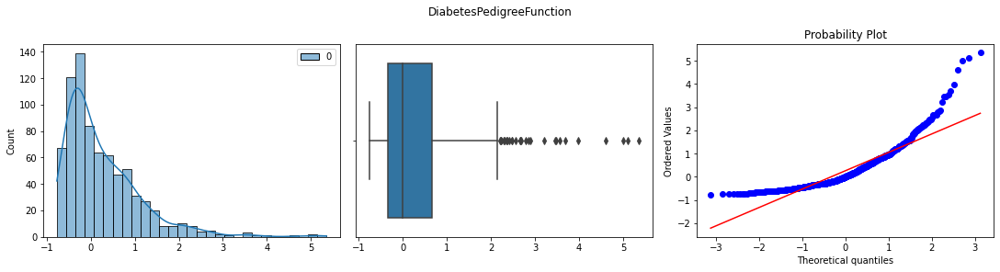

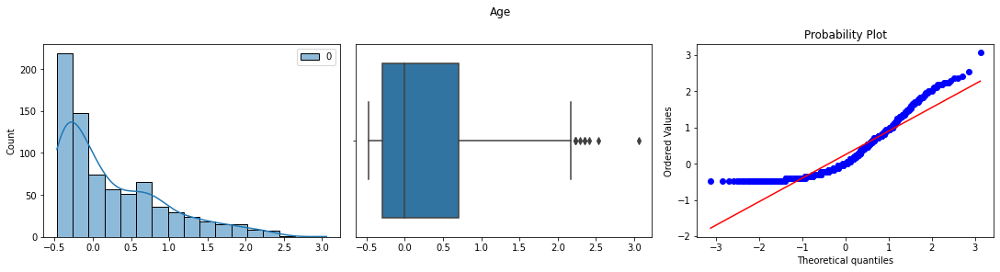

In [0]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', ]
rs = RobustScaler()
df_aux = pd.DataFrame(rs.fit(X).transform(X), columns=["Pregnancies","Glucose","BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age"])
display_dataset_distributions_transf (df_aux, features)
outliers_rs = total_outliers(df_aux, features)

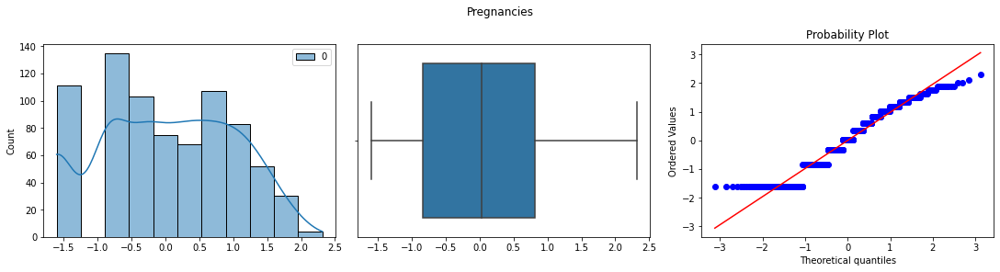

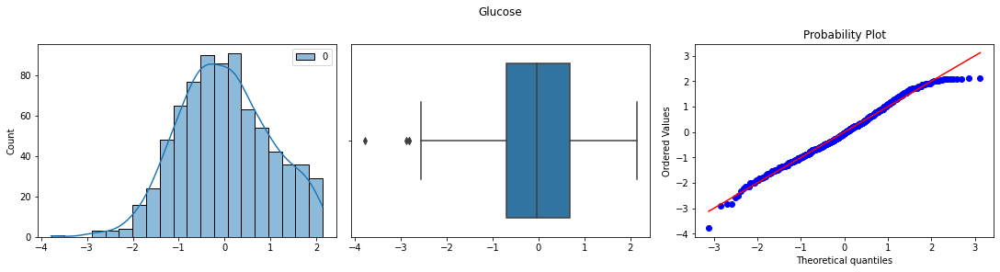

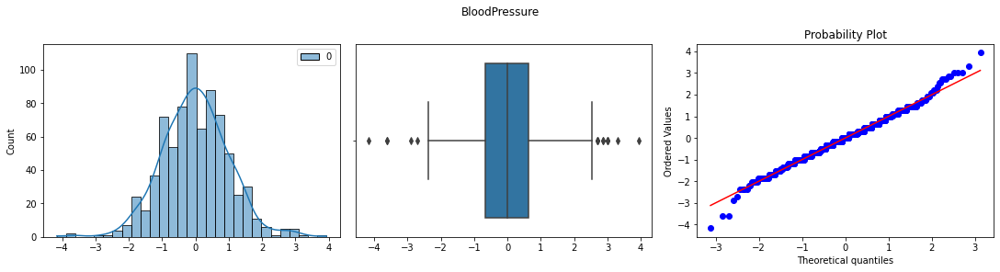

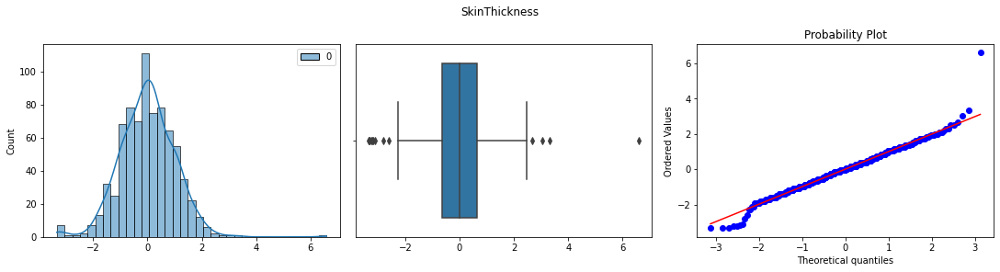

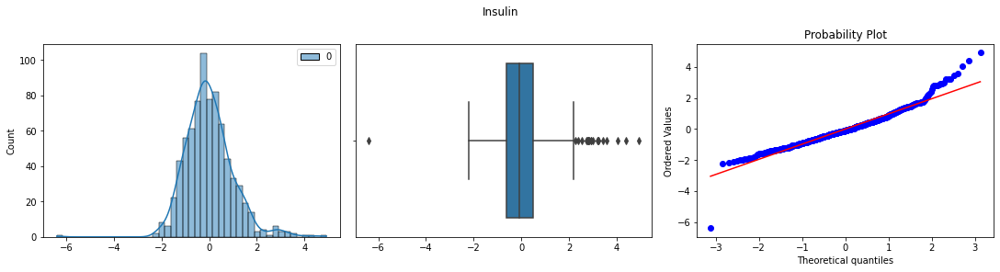

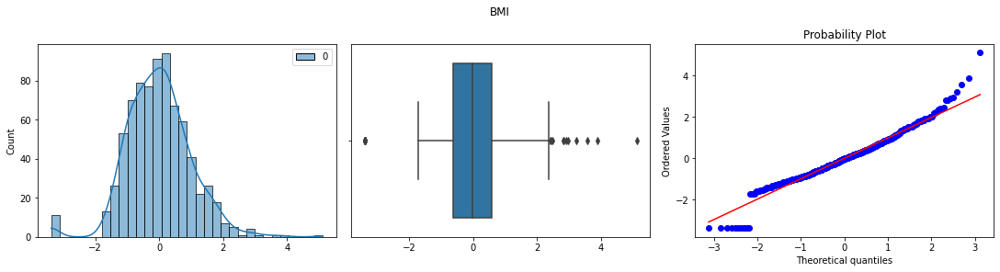

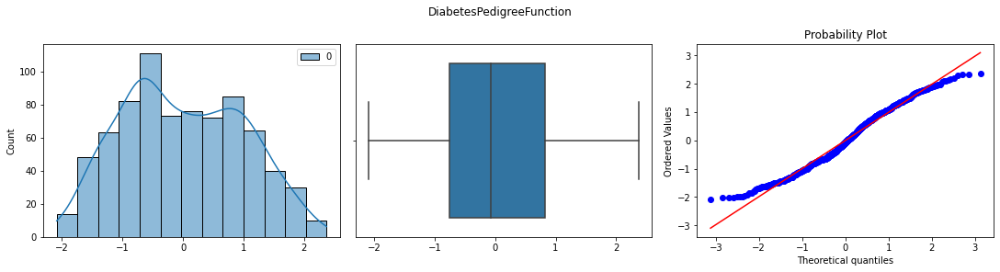

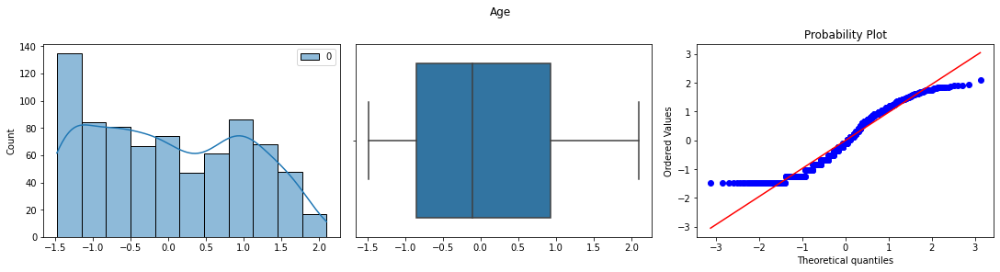

In [0]:
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', ]
pt = PowerTransformer(method='yeo-johnson')
df_aux = pd.DataFrame(pt.fit(X).transform(X), columns=["Pregnancies","Glucose","BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age"])
display_dataset_distributions_transf (df_aux, features)
outliers_pt = total_outliers(df_aux, features)

In [0]:
outliers_qt

,feature,outliers_livianos,outliers_zscore
0,Pregnancies,113.0,0.0
1,Glucose,3.0,2.0
2,BloodPressure,4.0,2.0
3,SkinThickness,5.0,3.0
4,Insulin,4.0,2.0
5,BMI,13.0,12.0
6,DiabetesPedigreeFunction,6.0,3.0
7,Age,64.0,1.0


**Observaciones:** 

- El método que mejor redujo el número de outlier es la transformación QuantileTransformer para aquellas variables que tienen distribuciones no normales (Pregnancies, DiabetesPedigreeFunction, Age).

- El método que mejor redujo el número de outlier es la transformación yeo-johnson para aquellas variables que tienen distribuciones no normales (Glucose, BloodPressure, SkinThickness, Insulin, BMI).

In [0]:
X = df.drop(columns=['Outcome'])
y = df.Outcome

### Modelos base sin tratamiento de outliers

LinearRegression()
LogisticRegression()
RandomForestClassifier()
DecisionTreeClassifier()


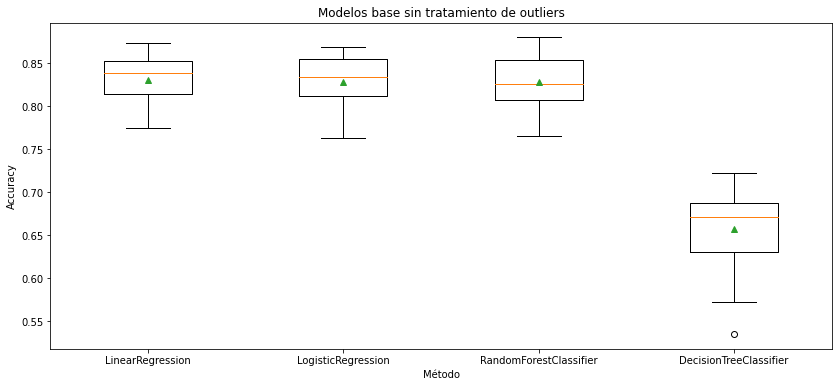

In [0]:
modelos = [LinearRegression(), LogisticRegression(), RandomForestClassifier(), DecisionTreeClassifier()]

results = []
with mlflow.start_run(run_name= "Modelos base sin tratamiento de outliers", experiment_id=813965220679556):
    for m in modelos:
        print (m)
        pipeline = Pipeline(steps=[
            ( 'imputer' ,IterativeImputer(n_nearest_features=4)),
            ( 'lr' , m)
        ])

        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=42)
        scores = cross_val_score(pipeline, X, y, scoring= 'roc_auc' , cv=cv, n_jobs=-1)
        results.append(scores)
        mlflow.log_metric(str(m), scores.mean())


    fig,axes = plt.subplots(1,figsize=(14,6))
    axes.boxplot(results,labels= ['LinearRegression','LogisticRegression', 'RandomForestClassifier', 'DecisionTreeClassifier'], showmeans=True)

    axes.set_xlabel("Método")
    axes.set_ylabel("Accuracy")
    axes.set_title("Modelos base sin tratamiento de outliers");
    plt.show()

### Correlación entre variables:

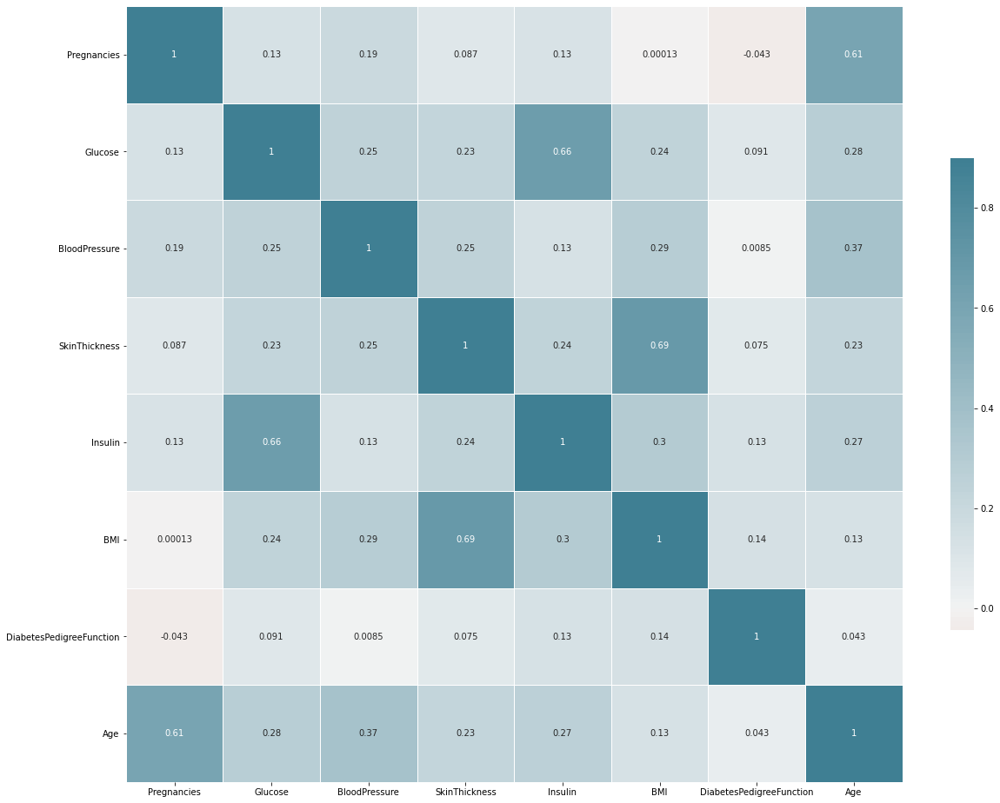

In [0]:
plt.figure(figsize=(20,20))

sns.heatmap(X.corr(method='spearman'), cmap=sns.diverging_palette(20, 220, n=200), vmax=.9, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)
plt.show()

plt.figure(figsize=(20,20))

sns.heatmap(X.corr(method='spearman'), cmap=sns.diverging_palette(20, 220, n=200), vmax=.9, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)
plt.show()

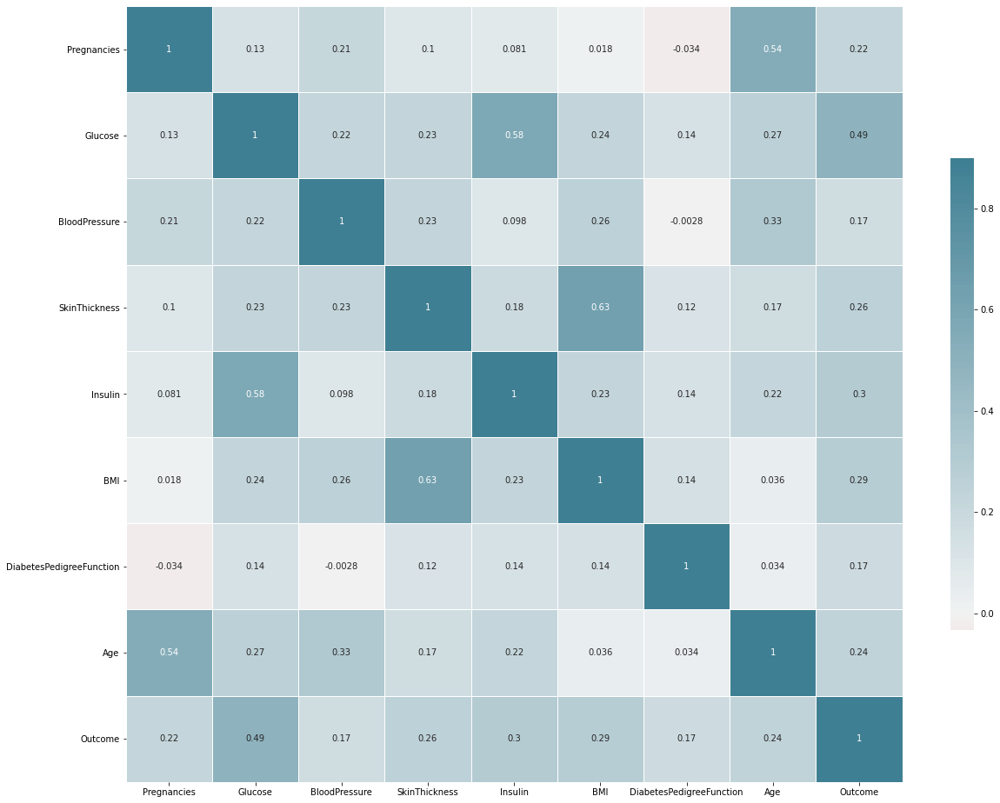

In [0]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(method='pearson'), cmap=sns.diverging_palette(20, 220, n=200), vmax=.9, center=0,square=True, linewidths=.5, cbar_kws={"shrink": .5},annot=True)
plt.show()

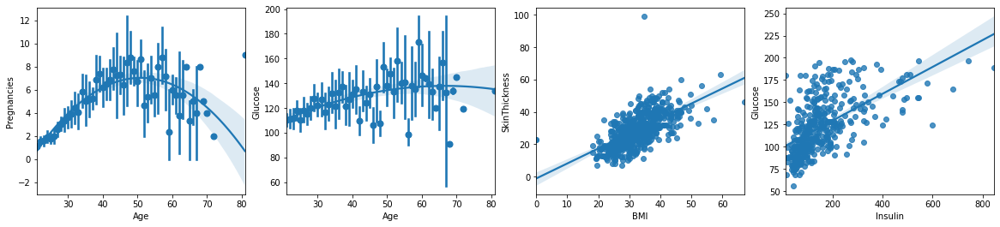

In [0]:
fig,axes = plt.subplots(1,4,figsize=(20,4))
sns.regplot(x="Age", y="Pregnancies", data=df, order=2,ax=axes[0], x_estimator=np.mean)
sns.regplot(x="Age", y="Glucose", data=df, order=2,ax=axes[1], x_estimator=np.mean)
sns.regplot(x="BMI", y="SkinThickness", data=df, order=1,ax=axes[2])
sns.regplot(x="Insulin", y="Glucose", data=df, order=1,ax=axes[3])
plt.show()

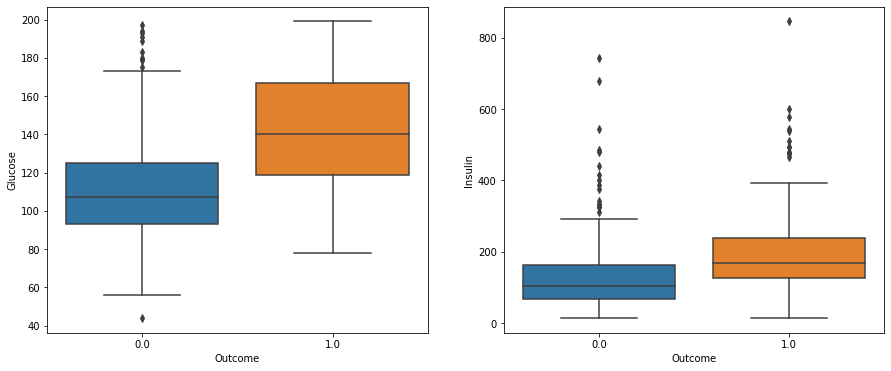

In [0]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6))
sns.boxplot(x="Outcome", y='Glucose', data=df, ax=axes[0])
sns.boxplot(x="Outcome", y='Insulin', data=df, ax=axes[1])

plt.show()

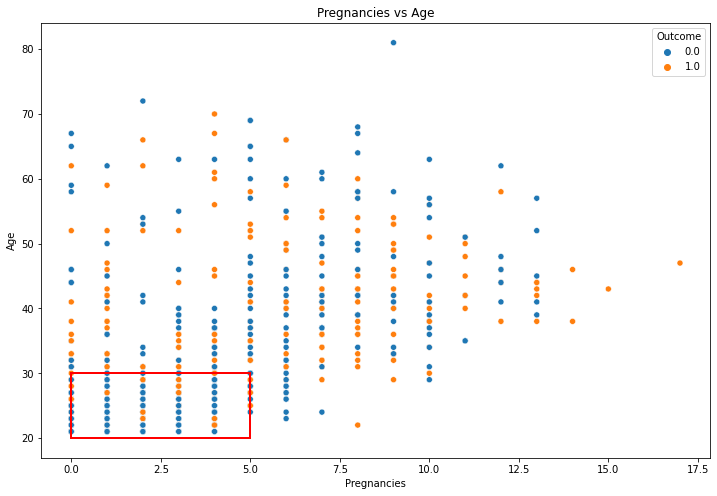

In [0]:
fig = plt.figure(figsize=(12,8))
ax1 = sns.scatterplot(x = df['Pregnancies'], y = df['Age'], hue = "Outcome",  data = df)
plt.plot([0, 5], [20, 20], linewidth=2, color = 'red')
plt.plot([0, 0], [20, 30], linewidth=2, color = 'red')
plt.plot([0, 5], [30, 30], linewidth=2, color = 'red')
plt.plot([5, 5], [20, 30], linewidth=2, color = 'red')

plt.title('Pregnancies vs Age')
plt.show()

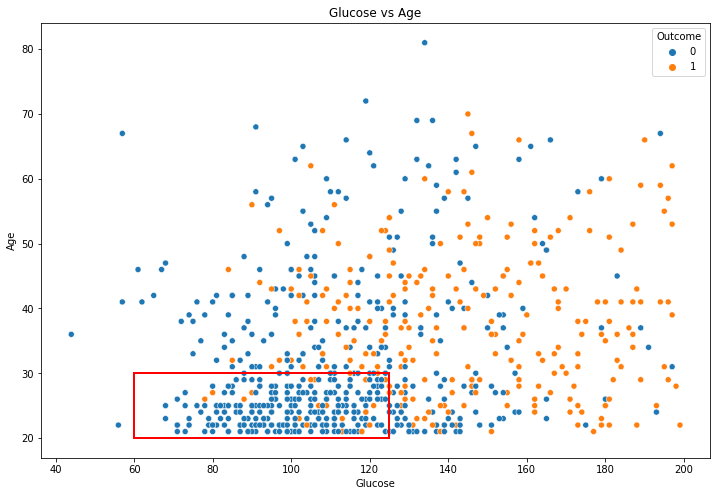

In [0]:
fig = plt.figure(figsize=(12,8))
ax1 = sns.scatterplot(x = df['Glucose'], y = df['Age'], hue = "Outcome",  data = df)
plt.plot([60, 125], [20, 20], linewidth=2, color = 'red')
plt.plot([60, 60], [20, 30], linewidth=2, color = 'red')
plt.plot([60, 125], [30, 30], linewidth=2, color = 'red')
plt.plot([125, 125], [20, 30], linewidth=2, color = 'red')
plt.title('Glucose vs Age')
plt.show()

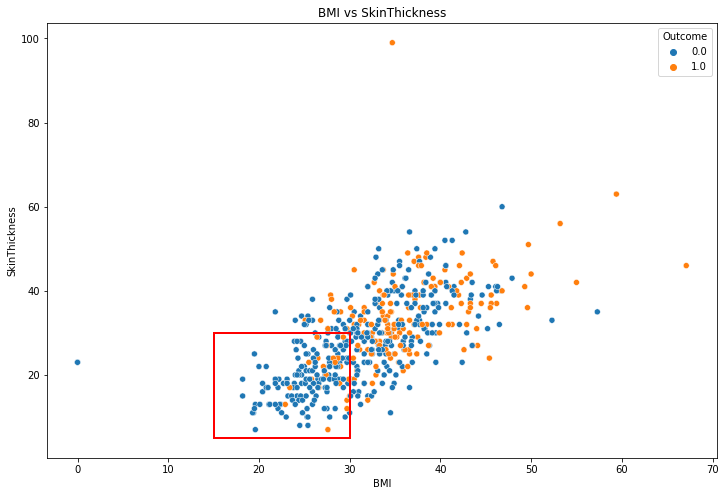

In [0]:
fig = plt.figure(figsize=(12,8))
ax1 = sns.scatterplot(x = df['BMI'], y = df['SkinThickness'], hue = "Outcome",  data = df)
plt.plot([15, 30], [5, 5], linewidth=2, color = 'red')
plt.plot([15, 15], [5, 30], linewidth=2, color = 'red')
plt.plot([15, 30], [30, 30], linewidth=2, color = 'red')
plt.plot([30, 30], [5, 30], linewidth=2, color = 'red')
plt.title('BMI vs SkinThickness')
plt.show()

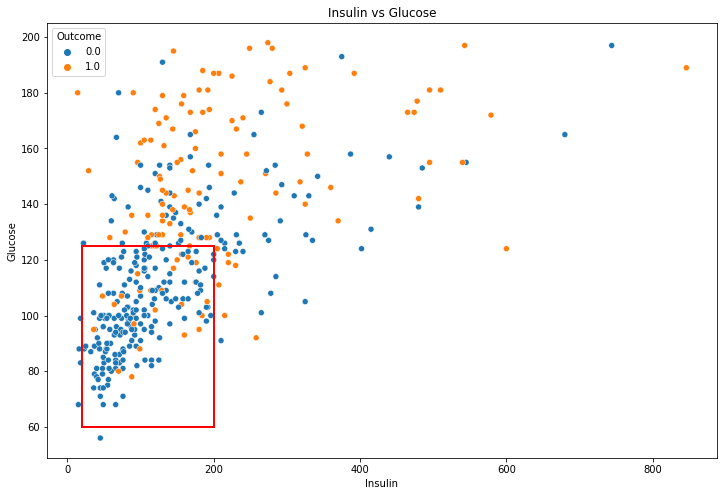

In [0]:
fig = plt.figure(figsize=(12,8))
ax1 = sns.scatterplot(x = df['Insulin'], y = df['Glucose'], hue = "Outcome",  data = df)
plt.plot([20, 200], [60, 60], linewidth=2, color = 'red')
plt.plot([20, 20], [60, 125], linewidth=2, color = 'red')
plt.plot([20, 200], [125, 125], linewidth=2, color = 'red')
plt.plot([200, 200], [60, 125], linewidth=2, color = 'red')
plt.title('Insulin vs Glucose')
plt.show()

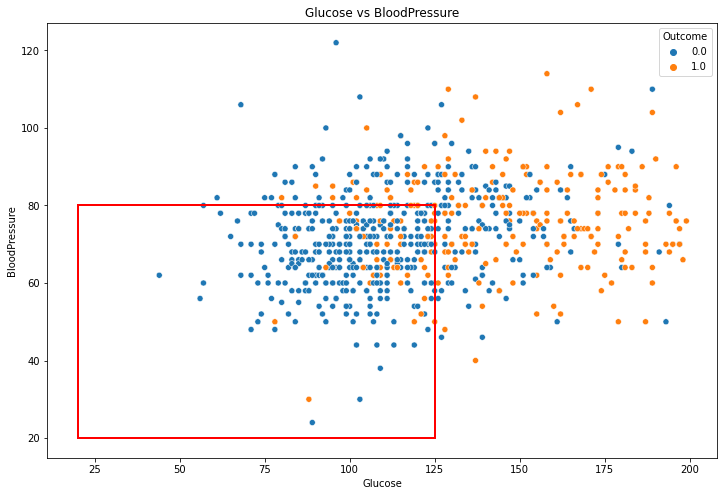

In [0]:
fig = plt.figure(figsize=(12,8))
ax1 = sns.scatterplot(x = df['Glucose'], y = df['BloodPressure'], hue = "Outcome",  data = df)
plt.plot([20, 125], [20, 20], linewidth=2, color = 'red')
plt.plot([20, 20], [20, 80], linewidth=2, color = 'red')
plt.plot([20, 125], [80, 80], linewidth=2, color = 'red')
plt.plot([125, 125], [20, 80], linewidth=2, color = 'red')
plt.title('Glucose vs BloodPressure')
plt.show()

**Observaciones:**
* Existe una fuerte correlación entre las variables Age y Pregnancies. Se observa un grupo de personas sanas que se encuentran por debajo de los 5 embarazos y menos de 30 años.
* Existe una fuerte correlación entre las variables Age y Glucose. Se observa un grupo de personas sanas que se encuentran por debajo de los 30 años y nivel de glucosa por debajo a 120.
* Existe una fuerte correlación entre las variables BloodPressure y Glucose. Se observa un grupo de personas sanas poseen niveles inferiores de 80 de presión arterial y menos de 125 en glucosa.
* Existe una fuerte correlación entre las variables BMI y SkinThickness.
* Existe una fuerte correlación entre las variables Insulin y Glucose
* Existe una fuerte correlación entre las variables Glucose, Insulin y la variable Target.

## Análisis de componentes principales

In [0]:
X = df.drop(columns=['Outcome'])
y = df.Outcome
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

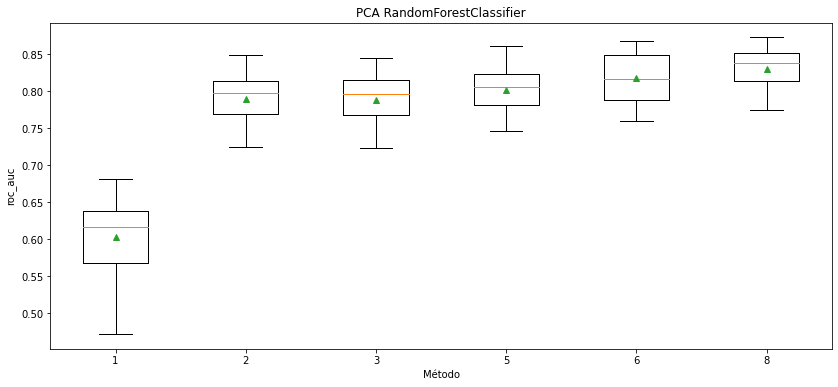

In [0]:
results=[]

param_grid = {'pca__n_components': [1, 2, 3, 5, 6, 8], }

pca = PCA()
with mlflow.start_run(run_name= "PCA RandomForestClassifier", experiment_id=813965220679556):

    for param in param_grid["pca__n_components"]:

        clf = Pipeline(steps=[( 'imputer' ,IterativeImputer(n_nearest_features=4)),('pca', PCA(n_components=param)), ( 'lr' , LinearRegression())])
        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=42)
        scores = cross_val_score(clf, X, y, scoring= 'roc_auc' , cv=cv, n_jobs=-1)
        results.append(scores)

        mlflow.log_metric("n_components="+str(param), scores.mean())

    fig,axes = plt.subplots(1,figsize=(14,6))
    axes.boxplot(results,labels=param_grid["pca__n_components"],showmeans=True)
    axes.set_xlabel("Método")
    axes.set_ylabel("roc_auc")
    axes.set_title("PCA RandomForestClassifier");
    plt.show()

LogisticRegression()
DecisionTreeClassifier()
SVC()
RandomForestClassifier()
AdaBoostClassifier()
KNeighborsClassifier()


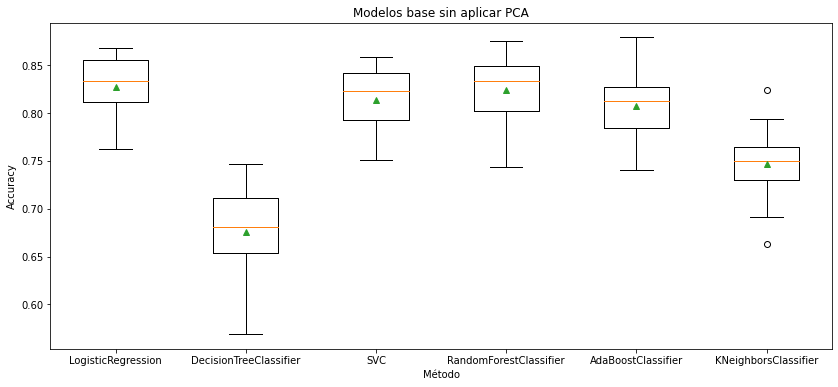

In [0]:
#Modelo
results = []
modelos = [LogisticRegression(), DecisionTreeClassifier(), SVC(), RandomForestClassifier(), AdaBoostClassifier(), KNeighborsClassifier() ]

with mlflow.start_run(run_name= "Modelos base sin aplicar PCA", experiment_id= 813965220679556):

    for m in modelos:
        print (m)

        clf = Pipeline(steps=[( 'imputer' ,IterativeImputer(n_nearest_features=4)), ("classifier", m)])

        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=42)
        scores = cross_val_score(clf, X, y, scoring= 'roc_auc' , cv=cv, n_jobs=-1)
        results.append(scores)

        mlflow.log_metric(str(m), scores.mean())

    fig,axes = plt.subplots(1,figsize=(14,6))
    axes.boxplot(results,labels= ['LogisticRegression','DecisionTreeClassifier', 'SVC', 'RandomForestClassifier', 'AdaBoostClassifier', 'KNeighborsClassifier' ], showmeans=True)

    axes.set_xlabel("Método")
    axes.set_ylabel("Accuracy")
    axes.set_title("Modelos base sin aplicar PCA");
    plt.show()

LogisticRegression()
DecisionTreeClassifier()
SVC()
RandomForestClassifier()
AdaBoostClassifier()


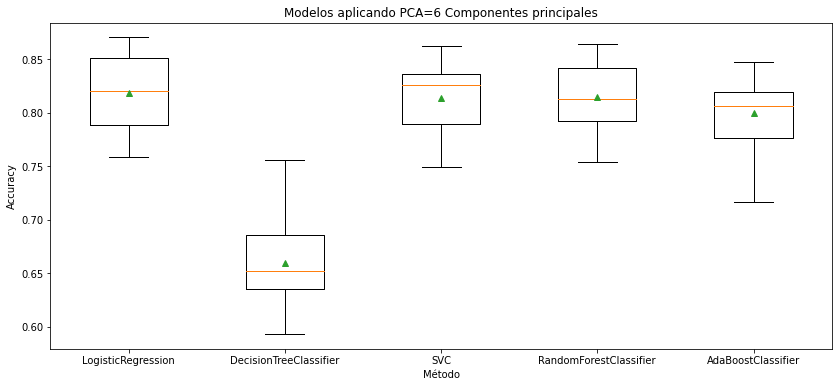

In [0]:
modelos = [LogisticRegression(), DecisionTreeClassifier(), SVC(), RandomForestClassifier(), AdaBoostClassifier() ]

results = []

with mlflow.start_run(run_name= "Modelos aplicando PCA=6", experiment_id= 813965220679556):
    
    for m in modelos:
        print (m)

        clf = Pipeline(steps=[( 'imputer' ,IterativeImputer(n_nearest_features=4)), ('pca', PCA(n_components=6)),  ("classifier", m)])
        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=42)
        scores = cross_val_score(clf, X, y, scoring= 'roc_auc' , cv=cv, n_jobs=-1)
        results.append(scores)
        mlflow.log_metric(str(m), scores.mean())

    fig,axes = plt.subplots(1,figsize=(14,6))
    axes.boxplot(results,labels= ['LogisticRegression','DecisionTreeClassifier', 'SVC', 'RandomForestClassifier', 'AdaBoostClassifier' ], showmeans=True)

    axes.set_xlabel("Método")
    axes.set_ylabel("Accuracy")
    axes.set_title("Modelos aplicando PCA=6 Componentes principales");
    plt.show()

**Observaciones:** 
- Se observa que utilizando 6 componentes es el punto optimo para mejorar el accuracy, sin embargo, no se observa una mejoría con respecto al modelo base. Como la dimensión de nuestro dataset no es tan grande vamos a descartar el uso de PCA para reducir la dimensionalidad en pos del tiempo de procesamiento.

## Técnicas de resampling balance de clases

1. Random Under-Sampling: En el proceso de Undersampling algunas observaciones son removidas de la clase mayoritaria. Esto es realizado hasta que la clase mayoritaria y minoritaria se encuentren balanceadas.

2. Random Over-Sampling: En el proceso de Oversampling algunas observaciones de la clase minoritaria son copiadas. Es una buena técnica cuando el dataset es limitado.

3. Synthetic Minority Oversampling Technique (SMOTE): Es una técnica estadística de sobremuestreo de minorías sintéticas para aumentar el número de casos de un conjunto de datos de forma equilibrada. El componente funciona cuando genera nuevas instancias a partir de casos minoritarios existentes que se proporcionan como entrada.

RandomUnderSampler()
RandomOverSampler()
SMOTE()


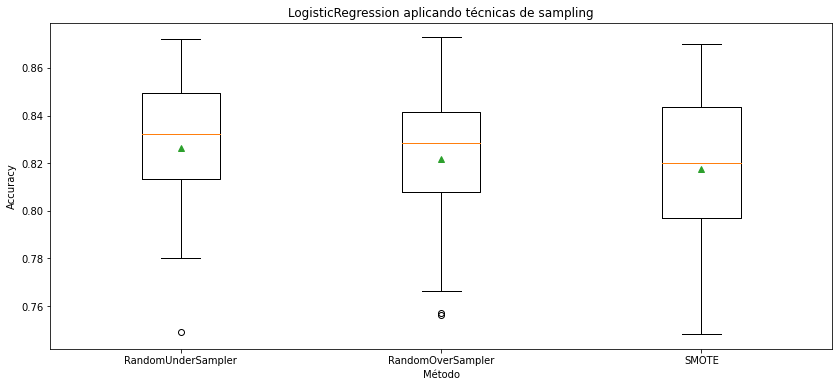

In [0]:
modelos = [RandomUnderSampler(), RandomOverSampler(), SMOTE()]

results = []

with mlflow.start_run(run_name= "LogisticRegression aplicando técnicas de sampling", experiment_id= 813965220679556):
    
    for m in modelos:
        print (m)

        clf = PipelineSampling(steps=[( 'imputer' ,IterativeImputer(n_nearest_features=4)), ("sampler", m), ("classifier", LogisticRegression())])
        cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=42)
        scores = cross_val_score(clf, X, y, scoring= 'roc_auc' , cv=cv, n_jobs=-1)
        results.append(scores)
        mlflow.log_metric(str(m), scores.mean())

    fig,axes = plt.subplots(1,figsize=(14,6))
    axes.boxplot(results,labels= ['RandomUnderSampler','RandomOverSampler', 'SMOTE'], showmeans=True)

    axes.set_xlabel("Método")
    axes.set_ylabel("Accuracy")
    axes.set_title("LogisticRegression aplicando técnicas de sampling");
    plt.show()

**Observaciones:** 
- Se observa que utilizando la técnica de RandomOverSampler se logra mejorar el valor del accuracy.

## Validación de modelos

In [0]:
accuracy = {}
accuracy = {'Modelo': '', 'Accuracy': '', 'f1': ''}
df_accuracy = pd.DataFrame(accuracy, index=[0])

In [0]:
X = df.drop(columns=['Outcome'])
y = df.Outcome
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [0]:
class RandomSearch(object):
    
    def __init__(self,X_train,y_train, hyperparameters, pipeline):
        
        self.X_train = X_train
        self.y_train = y_train
        self.hyperparameters = hyperparameters
        self.pipeline = pipeline
        
    def RandomSearch(self):
        # 10-fold y 100 iteraciones
        cv = 5
        search  = RandomizedSearchCV(self.pipeline,
                                 self.hyperparameters,
                                 random_state=1,
                                 n_iter=10,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        best_model = search.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model, best_model.best_params_
    
    def BestModelPridict(self,X_test):
        
        best_model, _ = self.RandomSearch()
        pred = best_model.predict(X_test)
        return pred

In [0]:
def compare(nombre_modelo, model, X_train, y_train, X_test, y_test, df_accuracy, iteration=100):

        mean_acc = np.zeros((iteration))
        std_acc = np.zeros((iteration))
        f1_scores = np.zeros((iteration))
        with mlflow.start_run(run_name= "Comparación de modelos " + nombre_modelo , experiment_id= 813965220679556):

            for it in range(iteration):
                # Train de model
                model = model.fit(X_train, y_train)

                # Predict
                y_hat = model.predict(X_test)   

                # Evaluar el modelo
                mean_acc[it] = accuracy_score(y_test, y_hat)    
                std_acc[it] = np.std(y_hat==y_test)/np.sqrt(y_hat.shape[0])
                f1_scores[it] = f1_score(y_test, y_hat, pos_label='1')
            
                mlflow.log_metric(str(nombre_modelo), f1_scores[it])
                
                
            plt.plot(range(1, iteration+1), mean_acc,'darkBlue')
            plt.fill_between(range(1, iteration+1), mean_acc - 1 * std_acc, mean_acc + 1 * std_acc, alpha=0.05)
            plt.legend(('Accuracy ', '+/- std'))
            plt.ylabel('Accuracy ')
            plt.xlabel('hp')
            plt.tight_layout()
            plt.show()

            a = {'Modelo': nombre_modelo, 'Accuracy': mean_acc.max(), 'f1': f1_scores.max()}
            df_accuracy = df_accuracy.append(a, ignore_index = True)


            print(f"La mejor exactitud {mean_acc.max():.2f} ")
            print(f"El mejor f1_score {f1_scores.max():.2f} ")
            return df_accuracy


In [0]:
set_config(display="diagram")

### LogisticRegression
- C : Valor de regularización, mientras mayor sea más fuerte sera la regularización.
- penalty: Puede ser del tipo l1 o l2

In [0]:
clf = PipelineSampling(steps=[('imputer' ,IterativeImputer(n_nearest_features=4)), 
                             ('resampling',RandomUnderSampler()),
                             ("classifier", LogisticRegression())])

clf

Pipeline(steps=[('imputer', IterativeImputer(n_nearest_features=4)),
 ('resampling', RandomUnderSampler()),
 ('classifier', LogisticRegression())]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('imputer', IterativeImputer(n_nearest_features=4)),
 ('resampling', RandomUnderSampler()),
 ('classifier', LogisticRegression())]) IterativeImputer IterativeImputer(n_nearest_features=4) RandomUnderSampler RandomUnderSampler() LogisticRegression LogisticRegression()

In [0]:
penalty = ['l2']

C = [0.001, 0.01, 0.1, 1, 10, 100]

solver = ['liblinear', 'newton-cg', 'sag', 'saga']

max_iter = [10, 100, 1000]

hyperparametro = dict(classifier__C=C, classifier__penalty=penalty, classifier__solver=solver, classifier__max_iter= max_iter)

In [0]:
LR_RandSearch = RandomSearch(X_train, y_train, hyperparametro, clf)
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

/databricks/python/lib/python3.8/site-packages/sklearn/model_selection/_search.py:292: UserWarning: The total space of parameters 72 is smaller than n_iter=100. Running 72 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
Best: 0.760589 using {'classifier__solver': 'newton-cg', 'classifier__penalty': 'l2', 'classifier__max_iter': 1000, 'classifier__C': 100}


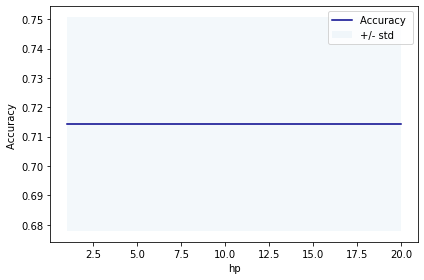

La mejor exactitud 0.71 
El mejor f1_score 0.55 


In [0]:
lr = LogisticRegression(solver='newton-cg', penalty='l2', max_iter=1000, C=100)
model = PipelineSampling(steps=[("preprocessor", preprocessor), 
#                              ('resampling',RandomOverSampler()),
                             ("classifier", lr)])
df_accuracy = compare("LogisticRegression" , model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

### KNN
- n_neighbors: Número de vecinos.

In [0]:
clf = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", KNeighborsClassifier())])
clf

Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', KNeighborsClassifier())]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', KNeighborsClassifier())]) preprocessor: ColumnTransformer ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies', 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure', 'SkinThickness',
 'Insulin', 'BMI'])]) quantile ['Pregnancies', 'DiabetesPedigreeFunction', 'Age'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() transf ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() RandomOverSampler RandomOverSampler() KNeighborsClassifier KNeighborsClassifier()

In [0]:
neighbors = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
param_grid = dict(classifier__n_neighbors=neighbors)

In [0]:
LR_RandSearch = RandomSearch(X_train, y_train, param_grid, clf)
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

/databricks/python/lib/python3.8/site-packages/sklearn/model_selection/_search.py:292: UserWarning: The total space of parameters 20 is smaller than n_iter=100. Running 20 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
Best: 0.767080 using {'classifier__n_neighbors': 18}


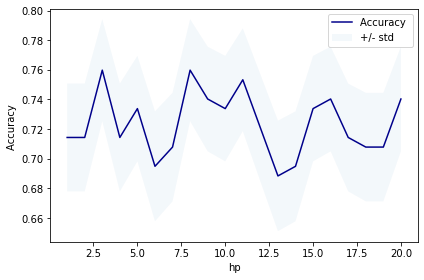

La mejor exactitud 0.76 
El mejor f1_score 0.68 


In [0]:
kn = KNeighborsClassifier(n_neighbors=12)
model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", kn)])
df_accuracy = compare("KNeighborsClassifier", model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

### DecisionTreeClassifier

- max_depth: Profundidad máxima del árbol.
- min_samples_leaf: Mínimo número de muestras requeridas para separar un nodo interno:
- criterion: Función que cuantifica la calidad del split.

In [0]:
clf = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", DecisionTreeClassifier())])
clf

Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', DecisionTreeClassifier())]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', DecisionTreeClassifier())]) preprocessor: ColumnTransformer ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies', 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure', 'SkinThickness',
 'Insulin', 'BMI'])]) quantile ['Pregnancies', 'DiabetesPedigreeFunction', 'Age'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() transf ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() RandomOverSampler RandomOverSampler() DecisionTreeClassifier DecisionTreeClassifier()

In [0]:
max_depth = [2, 3, 5, 10, 20]
min_samples_leaf = [5, 10, 20, 50, 100]
criterion = ["gini", "entropy"]

param_grid = dict(classifier__max_depth=max_depth, classifier__min_samples_leaf=min_samples_leaf, classifier__criterion=criterion)

In [0]:
LR_RandSearch = RandomSearch(X_train, y_train, param_grid, clf)
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

---------------------------------------------------------------------------
_RemoteTraceback                          Traceback (most recent call last)
_RemoteTraceback: 
"""
Traceback (most recent call last):
  File "/databricks/python/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py", line 431, in _process_worker
    r = call_item()
  File "/databricks/python/lib/python3.8/site-packages/joblib/externals/loky/process_executor.py", line 285, in __call__
    return self.fn(*self.args, **self.kwargs)
  File "/databricks/python/lib/python3.8/site-packages/joblib/_parallel_backends.py", line 595, in __call__
    return self.func(*args, **kwargs)
  File "/databricks/python/lib/python3.8/site-packages/joblib/parallel.py", line 262, in __call__
    return [func(*args, **kwargs)
  File "/databricks/python/lib/python3.8/site-packages/joblib/parallel.py", line 262, in <listcomp>
    return [func(*args, **kwargs)
  File "/databricks/python/lib/python3.8/site-packages/sklearn/

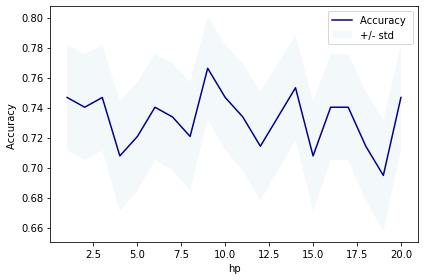

La mejor exactitud 0.77 
El mejor f1_score 0.69 


In [0]:
dt = DecisionTreeClassifier(min_samples_leaf=20, max_depth=5, criterion='gini')
model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", dt)])
df_accuracy = compare("DecisionTreeClassifier", model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

### SVM

- max_depth: Profundidad máxima del árbol.
- min_samples_leaf: Mínimo número de muestras requeridas para separar un nodo interno:
- criterion: Función que cuantifica la calidad del split.

In [0]:
clf = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", SVC())])
clf

Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()), ('classifier', SVC())]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()), ('classifier', SVC())]) preprocessor: ColumnTransformer ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies', 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure', 'SkinThickness',
 'Insulin', 'BMI'])]) quantile ['Pregnancies', 'DiabetesPedigreeFunction', 'Age'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() transf ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() RandomOverSampler RandomOverSampler() SVC SVC()

In [0]:
C = [0.1,1, 10, 100]
gamma = [1,0.1]
kernel = ['rbf', 'poly', 'sigmoid']

param_grid = dict(classifier__C=C, classifier__gamma=gamma, classifier__kernel=kernel)

In [0]:
LR_RandSearch = RandomSearch(X_train, y_train, param_grid, clf)
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

/databricks/python/lib/python3.8/site-packages/sklearn/model_selection/_search.py:292: UserWarning: The total space of parameters 24 is smaller than n_iter=100. Running 24 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


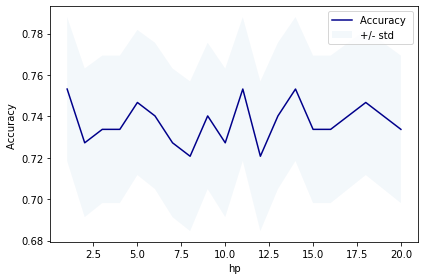

La mejor exactitud 0.75 
El mejor f1_score 0.60 


In [0]:
svc = SVC(kernel='poly', gamma=0.01, C=100)
model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", svc)])
df_accuracy = compare("SVC", model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

### RandomForestClassifier

- bootstrap = método de muestreo con o sin reposición.
- max_depth: Profundidad máxima del árbol.
- min_samples_leaf: Mínimo número de muestras requeridas para separar un nodo interno:
- min_samples_split = Número mínimo de muestras de datos para realizar el split en un nodo.
- n_estimators = Número de arboles en el bosque.
- max_features = Número máximo de feactures considerados para hacer el split.

In [0]:
clf = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", RandomForestClassifier(max_depth =None))])
clf

Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', RandomForestClassifier())]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', RandomForestClassifier())]) preprocessor: ColumnTransformer ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies', 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure', 'SkinThickness',
 'Insulin', 'BMI'])]) quantile ['Pregnancies', 'DiabetesPedigreeFunction', 'Age'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() transf ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() RandomOverSampler RandomOverSampler() RandomForestClassifier RandomForestClassifier()

In [0]:
bootstrap = [True, False]
max_depth = [10, 20,  None]
max_features = ['auto', 'sqrt']
min_samples_leaf = [1, 2, 4]
min_samples_split = [2, 5, 10]
n_estimators = [10,50, 100]
param_grid = dict(classifier__bootstrap=bootstrap, classifier__max_depth=max_depth, 
                  classifier__max_features=max_features, classifier__min_samples_leaf=min_samples_leaf,
                  classifier__min_samples_split=min_samples_split, classifier__n_estimators=n_estimators)

In [0]:
LR_RandSearch = RandomSearch(X_train, y_train, param_grid, clf)
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

Best: 0.762216 using {'classifier__n_estimators': 100, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__max_depth': 10, 'classifier__bootstrap': True}


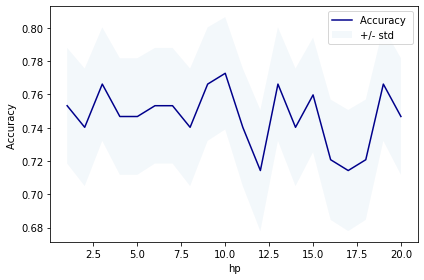

La mejor exactitud 0.77 
El mejor f1_score 0.70 


In [0]:
rf = RandomForestClassifier(n_estimators=50, min_samples_split=10, min_samples_leaf=1, max_features='sqrt', max_depth=20)

model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", rf)])
df_accuracy = compare("RandomForestClassifier",model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

### AdaBoostClassifier

- n_estimators = Número de arboles en el bosque.
- learning_rate= Peso aplicado en cada iteración.
- algorithm= If ‘SAMME.R’ then use the SAMME.R real boosting algorithm. base_estimator must support calculation of class probabilities. If ‘SAMME’ then use the SAMME discrete boosting algorithm.

In [0]:
clf = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", AdaBoostClassifier())])

clf

Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', AdaBoostClassifier())]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure',
 'SkinThickness', 'Insulin',
 'BMI'])])),
 ('resampling', RandomOverSampler()),
 ('classifier', AdaBoostClassifier())]) preprocessor: ColumnTransformer ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies', 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure', 'SkinThickness',
 'Insulin', 'BMI'])]) quantile ['Pregnancies', 'DiabetesPedigreeFunction', 'Age'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() transf ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() RandomOverSampler RandomOverSampler() AdaBoostClassifier AdaBoostClassifier()

In [0]:
n_estimators = [5, 10, 100]
learning_rate = [0.001, 0.01]
algorithm = ['SAMME', 'SAMME.R']

param_grid = dict(classifier__n_estimators=n_estimators, classifier__learning_rate=learning_rate, classifier__algorithm=algorithm )

In [0]:
LR_RandSearch = RandomSearch(X_train, y_train, param_grid, clf)
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning: The total space of parameters 12 is smaller than n_iter=100. Running 12 iterations. For exhaustive searches, use GridSearchCV.
  UserWarning,


Best: 0.726309 using {'classifier__n_estimators': 100, 'classifier__learning_rate': 0.01, 'classifier__algorithm': 'SAMME'}


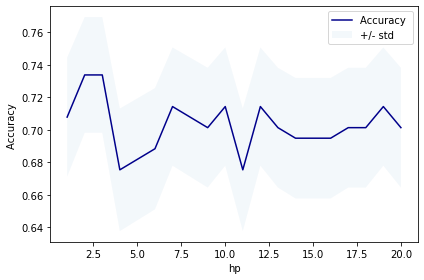

La mejor exactitud 0.73 
El mejor f1_score 0.61 


In [0]:
rf = AdaBoostClassifier(n_estimators= 100, learning_rate= 0.01, algorithm= 'SAMME')

model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", rf)])
df_accuracy = compare("AdaBoostClassifier", model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

### xgboost 

- max_depth = Máxima profundidad del árbol, utilizado para controlar el overfitting, si el valor es alto, se permitirá al modelo aprender relaciones más especificas.
-learning_rate = Learning rate shrinks the contribution of each tree by learning_rate.

In [0]:
clf = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", XGBClassifier())])

clf

Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'Bloo...
 interaction_constraints=None, learning_rate=None,
 max_delta_step=None, max_depth=None,
 min_child_weight=None, missing=nan,
 monotone_constraints=None, n_estimators=100,
 n_jobs=None, num_parallel_tree=None,
 predictor=None, random_state=None,
 reg_alpha=None, reg_lambda=None,
 scale_pos_weight=None, subsample=None,
 tree_method=None, validate_parameters=None,
 verbosity=None))]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'Bloo...
 interaction_constraints=None, learning_rate=None,
 max_delta_step=None, max_depth=None,
 min_child_weight=None, missing=nan,
 monotone_constraints=None, n_estimators=100,
 n_jobs=None, num_parallel_tree=None,
 predictor=None, random_state=None,
 reg_alpha=None, reg_lambda=None,
 scale_pos_weight=None, subsample=None,
 tree_method=None, validate_parameters=None,
 verbosity=None))]) preprocessor: ColumnTransformer ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies', 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure', 'SkinThickness',
 'Insulin', 'BMI'])]) quantile ['Pregnancies', 'DiabetesPedigreeFunction', 'Age'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() transf ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() RandomOverSampler RandomOverSampler() XGBClassifier XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
 colsample_bynode=None, colsample_bytree=None,
 enable_categorical=False, gamma=None, gpu_id=None,
 importance_type=None, interaction_constraints=None,
 learning_rate=None, max_delta_step=None, max_depth=None,
 min_child_weight=None, missing=nan, monotone_constraints=None,
 n_estimators=100, n_jobs=None, num_parallel_tree=None,
 predictor=None, random_state=None, reg_alpha=None,
 reg_lambda=None, scale_pos_weight=None, subsample=None,
 tree_method=None, validate_parameters=None, verbosity=None)

In [0]:
learning_rate = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30 ] 
max_depth = [ 3, 4, 5, 6, 8, 10, 12, 15]
min_child_weight = [ 1, 3, 5, 7 ]
gamma = [ 0.0, 0.1, 0.2 , 0.3, 0.4 ]
colsample_bytree = [ 0.3, 0.4, 0.5 , 0.7 ] 

param_grid = dict(classifier__max_depth=max_depth, classifier__learning_rate=learning_rate, classifier__min_child_weight=min_child_weight, classifier__gamma=gamma, classifier__colsample_bytree=colsample_bytree)

In [0]:
LR_RandSearch = RandomSearch(X_train, y_train, param_grid, clf)
Prediction_LR = LR_RandSearch.BestModelPridict(X_test)

/databricks/python/lib/python3.8/site-packages/sklearn/model_selection/_search.py:292: UserWarning: The total space of parameters 24 is smaller than n_iter=100. Running 24 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


/databricks/python/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
[16:20:28] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
/databricks/python/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassi

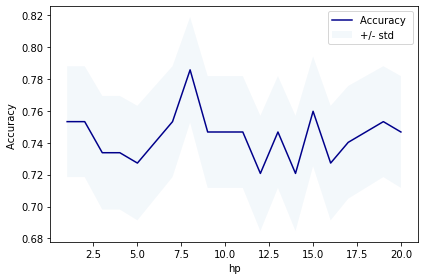

La mejor exactitud 0.79 
El mejor f1_score 0.72 


In [0]:
xg = XGBClassifier(min_child_weight= 3, max_depth= 3, learning_rate= 0.05, gamma = 0.1, colsample_bytree= 0.5 )

model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", xg)])
df_accuracy = compare("XGBClassifier", model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

## StackingClassifier:
Seleccionamos los cuatros modelos que mejor accuracy lograron para armar un clasificador del tipo stacking con ellos.

In [0]:
estimators = [
        ('dc', DecisionTreeClassifier(min_samples_leaf=20, max_depth=5, criterion='gini')),
        ('lr', LogisticRegression(solver='liblinear', penalty='l2', max_iter=10, C=100)),
        ('xg', XGBClassifier(colsample_bytree=0.5, gamma=0.1, learning_rate=0.05,
               min_child_weight=3))]

In [0]:
sclf = StackingClassifier(
     estimators=estimators, final_estimator=KNeighborsClassifier(n_neighbors=12)
)

clf = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("Stackingclassifier", sclf)])

In [0]:
clf

Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'Bloo...
 max_delta_step=None,
 max_depth=None,
 min_child_weight=3,
 missing=nan,
 monotone_constraints=None,
 n_estimators=100,
 n_jobs=None,
 num_parallel_tree=None,
 predictor=None,
 random_state=None,
 reg_alpha=None,
 reg_lambda=None,
 scale_pos_weight=None,
 subsample=None,
 tree_method=None,
 validate_parameters=None,
 verbosity=None))],
 final_estimator=KNeighborsClassifier(n_neighbors=12)))]) Please rerun this cell to show the HTML repr or trust the notebook. Pipeline Pipeline(steps=[('preprocessor',
 ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies',
 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'Bloo...
 max_delta_step=None,
 max_depth=None,
 min_child_weight=3,
 missing=nan,
 monotone_constraints=None,
 n_estimators=100,
 n_jobs=None,
 num_parallel_tree=None,
 predictor=None,
 random_state=None,
 reg_alpha=None,
 reg_lambda=None,
 scale_pos_weight=None,
 subsample=None,
 tree_method=None,
 validate_parameters=None,
 verbosity=None))],
 final_estimator=KNeighborsClassifier(n_neighbors=12)))]) preprocessor: ColumnTransformer ColumnTransformer(transformers=[('quantile',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Pregnancies', 'DiabetesPedigreeFunction',
 'Age']),
 ('transf',
 Pipeline(steps=[('imputer',
 IterativeImputer(n_nearest_features=4)),
 ('scaler',
 PowerTransformer())]),
 ['Glucose', 'BloodPressure', 'SkinThickness',
 'Insulin', 'BMI'])]) quantile ['Pregnancies', 'DiabetesPedigreeFunction', 'Age'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() transf ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI'] IterativeImputer IterativeImputer(n_nearest_features=4) PowerTransformer PowerTransformer() RandomOverSampler RandomOverSampler() Stackingclassifier: StackingClassifier StackingClassifier(estimators=[('dc',
 DecisionTreeClassifier(max_depth=5,
 min_samples_leaf=20)),
 ('lr',
 LogisticRegression(C=100, max_iter=10,
 solver='liblinear')),
 ('xg',
 XGBClassifier(base_score=None, booster=None,
 colsample_bylevel=None,
 colsample_bynode=None,
 colsample_bytree=0.5,
 enable_categorical=False,
 gamma=0.1, gpu_id=None,
 importance_type=None,
 interacti...
 max_delta_step=None,
 max_depth=None,
 min_child_weight=3, missing=nan,
 monotone_constraints=None,
 n_estimators=100, n_jobs=None,
 num_parallel_tree=None,
 predictor=None, random_state=None,
 reg_alpha=None, reg_lambda=None,
 scale_pos_weight=None,
 subsample=None, tree_method=None,
 validate_parameters=None,
 verbosity=None))],
 final_estimator=KNeighborsClassifier(n_neighbors=12)) dc DecisionTreeClassifier DecisionTreeClassifier(max_depth=5, min_samples_leaf=20) lr LogisticRegression LogisticRegression(C=100, max_iter=10, solver='liblinear') xg XGBClassifier XGBClassifier(base_score=None, booster=None, colsample_bylevel=None,
 colsample_bynode=None, colsample_bytree=0.5,
 enable_categorical=False, gamma=0.1, gpu_id=None,
 importance_type=None, interaction_constraints=None,
 learning_rate=0.05, max_delta_step=None, max_depth=None,
 min_child_weight=3, missing=nan, monotone_constraints=None,
 n_estimators=100, n_jobs=None, num_parallel_tree=None,
 predictor=None, random_state=None, reg_alpha=None,
 reg_lambda=None, scale_pos_weight=None, subsample=None,
 tree_method=None, validate_parameters=None, verbosity=None) final_estimator KNeighbor

/databricks/python/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
[16:21:10] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
/databricks/python/lib/python3.8/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassi

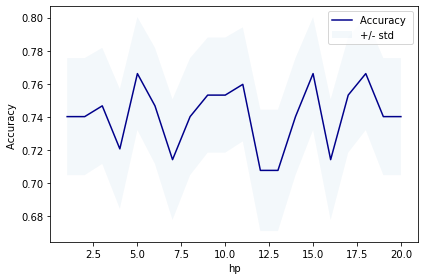

La mejor exactitud 0.77 
El mejor f1_score 0.67 


In [0]:
df_accuracy = compare("StackingClassifier", clf, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

In [0]:
df_accuracy

,Modelo,Accuracy,f1
0,,,
1,LogisticRegression,0.746753,0.672269
2,KNeighborsClassifier,0.772727,0.700855
3,DecisionTreeClassifier,0.766234,0.7
4,SVC,0.74026,0.631579
5,RandomForestClassifier,0.74026,0.649123
6,AdaBoostClassifier,0.688312,0.631579
7,XGBClassifier,0.75974,0.704
8,StackingClassifier,0.766234,0.689655


## Comparación de modelos:

* Dado que nuestro dataset no posee una alta dimensionalidad no se utilizo PCA para mejorar el performance del modelo.

* Las técnicas de remuestreo ayudo a mejorar levemente la performance de los modelos.
 
* Dado la naturaleza del problema se opto por la métrica f1 (nos interesa ponderar los falsos positivos así como los falsos negativos) ya toma en cuenta las métricas de precision y recall en un sólo valor. Esto es práctico porque hace más fácil el poder comparar el rendimiento combinado de la precisión y la exhaustivas entre varias soluciones.

* El tratamiento de los outliers ayudo a mejorar a aquellos modelos de naturaleza lineal. Y no afecto en gran medida a los modelos basados en arboles.

* Se observa que los modelos se desempeñaron muy similares comparando los valores de accuracy y f1 score.

* Existen diferencias entre el desempeño de los modelos en el set de entrenamiento y el set de test. Es muy probable que sea necesario un numero mayor de muestras para no alterar la distribución al momento de realizar el split en train y test.

* El modelo de XGBClassifier fue el que mayor accuracy y f1 arrojo.

## Tunning Hiper parametros:

### ML Flow en Data Bricks:

### Hyperopt

In [0]:
!pip install hyperopt -q

In [0]:
from hyperopt import tpe, hp, fmin, STATUS_OK,SparkTrials
from hyperopt.pyll.base import scope

In [0]:
X = df.drop(columns=['Outcome'])
y = df.Outcome
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [0]:
def hyperparameter_tuning(params):

    var_quantile = ["Pregnancies", "DiabetesPedigreeFunction", "Age"]
    quantile_transformer = Pipeline(
    steps=[("imputer", IterativeImputer(n_nearest_features=4)), 
            ("scaler", QuantileTransformer(n_quantiles=200, output_distribution='normal'))])

    var_transf = ["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI"]
    quantile_transformer = Pipeline(
    steps=[("imputer", IterativeImputer(n_nearest_features=4)), 
           ("scaler", PowerTransformer(method='yeo-johnson'))])

    preprocessor = ColumnTransformer( transformers=[
        ("quantile", quantile_transformer, var_quantile),
        ("transf", quantile_transformer, var_transf),])

    model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", RandomForestClassifier(**params,n_jobs=-1))])
    
    # Train de model
    model = model.fit(X_train, y_train)

    # Predict
    y_hat = model.predict(X_test)   

    # Evaluar el modelo
    
    f1 = f1_score(y_test, y_hat, pos_label='1')
    mlflow.log_metric("RandomForestClassifier", f1)
    return {"loss": -f1, "status": STATUS_OK}

In [0]:
space = {
    "n_estimators": hp.choice("n_estimators", range(1,500)),
    "max_depth": hp.quniform("max_depth", 1, 15,1),
    "criterion": hp.choice("criterion", ["gini", "entropy"]),
    'max_features': hp.choice('max_features', range(1,X_train.shape[1])),
    'min_samples_split':hp.quniform('min_samples_split', 0.1 , 1, 0.1),
    'min_samples_leaf':hp.choice('min_samples_leaf', range(1,5)),
    'ccp_alpha':hp.quniform('ccp_alpha', 0 , 0.05, 0.01)
     }

In [0]:
trials = SparkTrials()

with mlflow.start_run(nested=True):
  best = fmin(
    fn=hyperparameter_tuning,
    space=space,
    algo=tpe.suggest,
    max_evals=200,
    trials=trials)

print("Best: {}".format(best))

Because the requested parallelism was None or a non-positive value, parallelism will be set to (8), which is Spark's default parallelism (8), or 1, whichever is greater. We recommend setting parallelism explicitly to a positive value because the total of Spark task slots is subject to cluster sizing.
100%|██████████| 200/200 [07:50<00:00,  2.35s/trial, best loss: -0.7058823529411764]
Total Trials: 200: 200 succeeded, 0 failed, 0 cancelled.
Best: {'ccp_alpha': 0.0, 'criterion': 1, 'max_depth': 11.0, 'max_features': 5, 'min_samples_leaf': 3, 'min_samples_split': 0.1, 'n_estimators': 55}


### TPOTClassifier

In [0]:
!pip install tpot -q

In [0]:
from tpot import TPOTClassifier

/databricks/python/lib/python3.8/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")


In [0]:
pipeline_optimizer = TPOTClassifier(generations=5, population_size=100, cv=5,
                                    random_state=42, verbosity=2, scoring='f1', n_jobs=-1)

In [0]:
X_train.values.astype('float')

Out[183]: array([[1.00e+00, 9.00e+01, 6.20e+01, ..., 2.72e+01, 5.80e-01, 2.40e+01],
       [5.00e+00, 1.26e+02, 7.80e+01, ..., 2.96e+01, 4.39e-01, 4.00e+01],
       [2.00e+00, 1.05e+02, 5.80e+01, ..., 3.49e+01, 2.25e-01, 2.50e+01],
       ...,
       [1.00e+00, 9.70e+01, 7.00e+01, ..., 3.81e+01, 2.18e-01, 3.00e+01],
       [1.00e+01, 1.11e+02, 7.00e+01, ..., 2.75e+01, 1.41e-01, 4.00e+01],
       [4.00e+00, 1.44e+02, 5.80e+01, ..., 2.95e+01, 2.87e-01, 3.70e+01]])

In [0]:
pipeline_optimizer.fit(X_train.values.astype('float'), y_train.astype('float'))

Optimization Progress:   0%|          | 0/600 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.6593705805608464

Generation 2 - Current best internal CV score: 0.6593705805608464

Generation 3 - Current best internal CV score: 0.6646861796371227

Generation 4 - Current best internal CV score: 0.6704063764204016

Generation 5 - Current best internal CV score: 0.6704063764204016

Best pipeline: RandomForestClassifier(GradientBoostingClassifier(input_matrix, learning_rate=0.01, max_depth=5, max_features=0.9000000000000001, min_samples_leaf=3, min_samples_split=20, n_estimators=100, subsample=0.45), bootstrap=True, criterion=gini, max_features=0.7000000000000001, min_samples_leaf=19, min_samples_split=20, n_estimators=100)


TPOTClassifier(generations=5, n_jobs=-1, random_state=42, scoring='f1',
 verbosity=2) Please rerun this cell to show the HTML repr or trust the notebook. TPOTClassifier TPOTClassifier(generations=5, n_jobs=-1, random_state=42, scoring='f1',
 verbosity=2)

In [0]:
pipeline_optimizer.score(X_test.astype('float'), y_test.astype('float'))

Out[185]: 0.6285714285714287

In [0]:
pipeline_optimizer.export('tpot_exported_pipeline.py')

In [0]:
!cat tpot_exported_pipeline.py

import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from tpot.export_utils import set_param_recursive

# NOTE: Make sure that the outcome column is labeled 'target' in the data file
tpot_data = pd.read_csv('PATH/TO/DATA/FILE', sep='COLUMN_SEPARATOR', dtype=np.float64)
features = tpot_data.drop('target', axis=1)
training_features, testing_features, training_target, testing_target = \
            train_test_split(features, tpot_data['target'], random_state=42)

# Average CV score on the training set was: 0.6704063764204016
exported_pipeline = make_pipeline(
    StackingEstimator(estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=5, max_features=0.9000000000000001, min_samples_leaf=3, min_samples_split=20, n_estimators=100, subsample=0.45)),
    RandomForest

## Comparación diferentes tecnicas detección hiperparámetros:

In [0]:
accuracy = {}
accuracy = {'Modelo': '', 'Accuracy': '', 'f1': ''}
df_accuracy = pd.DataFrame(accuracy, index=[0])

In [0]:
Best: 0.762216 using {'classifier__n_estimators': 100, 'classifier__min_samples_split': 5, 'classifier__min_samples_leaf': 2, 'classifier__max_features': 'sqrt', 'classifier__max_depth': 10, 'classifier__bootstrap': True}

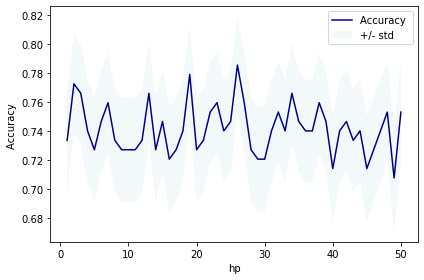

La mejor exactitud 0.79 
El mejor f1_score 0.71 


In [0]:
#Parametros encontrados con gridserach
rf = RandomForestClassifier(n_estimators=100, min_samples_split=5, min_samples_leaf=2, max_features='sqrt', max_depth=10,bootstrap=True )

model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", rf)])

df_accuracy = compare("GridSearch",model, X_train, y_train, X_test, y_test, df_accuracy, iteration=50)

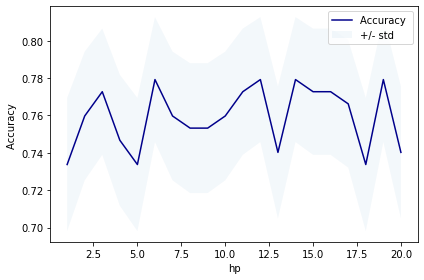

La mejor exactitud 0.78 
El mejor f1_score 0.73 


In [0]:
rf = RandomForestClassifier(ccp_alpha=0.0, criterion= 'entropy', n_estimators=55, min_samples_split=0.1, min_samples_leaf=3, max_features=6, max_depth=5.0)

model = PipelineSampling(steps=[("preprocessor", preprocessor), 
                             ('resampling',RandomOverSampler()),
                             ("classifier", rf)])

df_accuracy = compare("Hyperopt",model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

/databricks/python/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/databricks/python/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/databricks/python/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/databricks/python/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/databricks/python/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(
/databricks/python/l

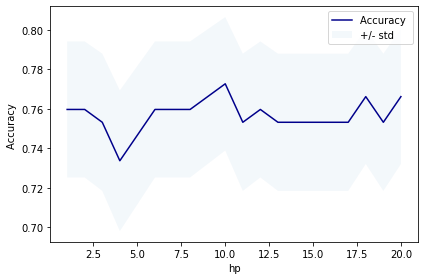

La mejor exactitud 0.77 
El mejor f1_score 0.67 


In [0]:
import numpy as np
import pandas as pd
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline, make_union
from tpot.builtins import StackingEstimator
from tpot.export_utils import set_param_recursive

# Average CV score on the training set was: 0.6704063764204016
model = make_pipeline(
    StackingEstimator(estimator=GradientBoostingClassifier(learning_rate=0.01, max_depth=5, max_features=0.9000000000000001, min_samples_leaf=3, min_samples_split=20, n_estimators=100, subsample=0.45)),
    RandomForestClassifier(bootstrap=True, criterion="gini", max_features=0.7000000000000001, min_samples_leaf=19, min_samples_split=20, n_estimators=100)
)
# Fix random state for all the steps in exported pipeline


df_accuracy = compare("TPOT",model, X_train, y_train, X_test, y_test, df_accuracy, iteration=20)

In [0]:
df_accuracy

,Modelo,Accuracy,f1
0,,,
1,GridSearch,0.785714,0.707965
2,Hyperopt,0.779221,0.725806
3,TPOT,0.772727,0.672727
